# **Thank You for opening this notebook!!!**
## **If you find this notebook useful then please upvote.**

# Introduction to Exploritary Data Analysis
Analyzing a dataset typically involves several key steps :
1. [Step 0: Imports and Reading data](#1)
2. [Step 1: data Understanding](#2)
3. [Step 2: data Prep](#3)
4. [Step 3: Feature Understanding](#4)
5. [Step 4: Feature Relationships](#5)
6. [Step 5: Analyse Hypothese](#6)
7. [Step 6: data Cleaning](#7)
8. [Step 7: Model Building (If Applicable):](#8)
9. [Step 8: Model Evaluation:](#9)
10. [Step 9: Make Pipline:](#10)
11. [Step 10: Feature Engineering:](#11)
12. [Step 11: Feature Scalling:](#12)


# [Step 0: Imports and Reading data]()<a id="1"></a> <br>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import scipy.stats as sc
import statistics as st
pd.set_option('display.max_row',111)
pd.set_option('display.max_column',111)
# plt.style.use('dark_background')
plt.style.use('ggplot')

df = pd.read_csv('D:\Paractical data scientist\Employee Attrition\\WA_Fn-UseC_-HR-Employee-Attrition.csv')
df = df.copy()

In [2]:
df.drop_duplicates(inplace = True)
df.shape

(1470, 35)

In [3]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField', 'EmployeeCount',
       'EmployeeNumber', 'EnvironmentSatisfaction', 'Gender', 'HourlyRate',
       'JobInvolvement', 'JobLevel', 'JobRole', 'JobSatisfaction',
       'MaritalStatus', 'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked',
       'Over18', 'OverTime', 'PercentSalaryHike', 'PerformanceRating',
       'RelationshipSatisfaction', 'StandardHours', 'StockOptionLevel',
       'TotalWorkingYears', 'TrainingTimesLastYear', 'WorkLifeBalance',
       'YearsAtCompany', 'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [4]:
df.describe()

,Age,DailyRate,DistanceFromHome,Education,EmployeeCount,EmployeeNumber,EnvironmentSatisfaction,HourlyRate,JobInvolvement,JobLevel,JobSatisfaction,MonthlyIncome,MonthlyRate,NumCompaniesWorked,PercentSalaryHike,PerformanceRating,RelationshipSatisfaction,StandardHours,StockOptionLevel,TotalWorkingYears,TrainingTimesLastYear,WorkLifeBalance,YearsAtCompany,YearsInCurrentRole,YearsSinceLastPromotion,YearsWithCurrManager
count,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.0,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000,1470.000000
mean,36.923810,802.485714,9.192517,2.912925,1.0,1024.865306,2.721769,65.891156,2.729932,2.063946,2.728571,6502.931293,14313.103401,2.693197,15.209524,3.153741,2.712245,80.0,0.793878,11.279592,2.799320,2.761224,7.008163,4.229252,2.187755,4.123129
std,9.135373,403.509100,8.106864,1.024165,0.0,602.024335,1.093082,20.329428,0.711561,1.106940,1.102846,4707.956783,7117.786044,2.498009,3.659938,0.360824,1.081209,0.0,0.852077,7.780782,1.289271,0.706476,6.126525,3.623137,3.222430,3.568136
min,18.000000,102.000000,1.000000,1.000000,1.0,1.000000,1.000000,30.000000,1.000000,1.000000,1.000000,1009.000000,2094.000000,0.000000,11.000000,3.000000,1.000000,80.0,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,30.000000,465.000000,2.000000,2.000000,1.0,491.250000,2.000000,48.000000,2.000000,1.000000,2.000000,2911.000000,8047.000000,1.000000,12.000000,3.000000,2.000000,80.0,0.000000,6.000000,2.000000,2.000000,3.000000,2.000000,0.000000,2.000000
50%,36.000000,802.000000,7.000000,3.000000,1.0,1020.500000,3.000000,66.000000,3.000000,2.000000,3.000000,4919.000000,14235.500000,2.000000,14.000000,3.000000,3.000000,80.0,1.000000,10.000000,3.000000,3.000000,5.000000,3.000000,1.000000,3.000000
75%,43.000000,1157.000000,14.000000,4.000000,1.0,1555.750000,4.000000,83.750000,3.000000,3.000000,4.000000,8379.000000,20461.500000,4.000000,18.000000,3.000000,4.000000,80.0,1.000000,15.000000,3.000000,3.000000,9.000000,7.000000,3.000000,7.000000
max,60.000000,1499.000000,29.000000,5.000000,1.0,2068.000000,4.000000,100.000000,4.000000,5.000000,4.000000,19999.000000,26999.000000,9.000000,25.000000,4.000000,4.000000,80.0,3.000000,40.000000,6.000000,4.000000,40.000000,18.000000,15.000000,17.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1470 entries, 0 to 1469
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Age                       1470 non-null   int64 
 1   Attrition                 1470 non-null   object
 2   BusinessTravel            1470 non-null   object
 3   DailyRate                 1470 non-null   int64 
 4   Department                1470 non-null   object
 5   DistanceFromHome          1470 non-null   int64 
 6   Education                 1470 non-null   int64 
 7   EducationField            1470 non-null   object
 8   EmployeeCount             1470 non-null   int64 
 9   EmployeeNumber            1470 non-null   int64 
 10  EnvironmentSatisfaction   1470 non-null   int64 
 11  Gender                    1470 non-null   object
 12  HourlyRate                1470 non-null   int64 
 13  JobInvolvement            1470 non-null   int64 
 14  JobLevel                

# [Step 2: data Preperation]()<a id="3"></a> <br>

- Dropping irrelevant columns and rows

In [6]:
for col in df.select_dtypes('object'):
    if len(df[col].unique()) == 1 :
        print("we drop "+col+" : Observing Unique Values")
        df.drop([col], axis=1, inplace=True)

we drop Over18 : Observing Unique Values


<Axes: ylabel='proportion'>

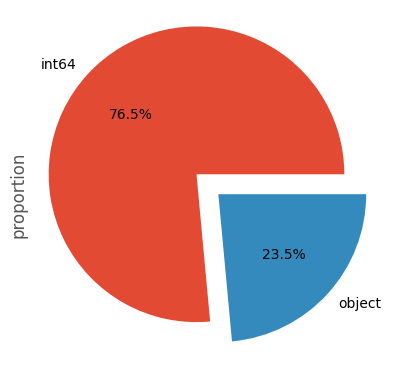

In [7]:
plt.figure()
df.dtypes.value_counts(normalize=True).plot.pie(autopct='%1.1f%%', explode =(0.2,0))

In [8]:
df.drop(['EmployeeCount' , 'EmployeeNumber'] , axis = 1,inplace=True)

- - Cleaning Column (always use it  for column_y)

In [9]:
for col in df.select_dtypes('object'):
    if len(df[col].unique()) <= 20 :
        print(f'{col :-<40} {df[col].unique()}')

Attrition------------------------------- ['Yes' 'No']
BusinessTravel-------------------------- ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']
Department------------------------------ ['Sales' 'Research & Development' 'Human Resources']
EducationField-------------------------- ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']
Gender---------------------------------- ['Female' 'Male']
JobRole--------------------------------- ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']
MaritalStatus--------------------------- ['Single' 'Married' 'Divorced']
OverTime-------------------------------- ['Yes' 'No']


In [10]:
for col in df.select_dtypes(include=['float','int']):
    print(f'{col :-<40} {df[col].median()}')

Age------------------------------------- 36.0
DailyRate------------------------------- 802.0
DistanceFromHome------------------------ 7.0
Education------------------------------- 3.0
EnvironmentSatisfaction----------------- 3.0
HourlyRate------------------------------ 66.0
JobInvolvement-------------------------- 3.0
JobLevel-------------------------------- 2.0
JobSatisfaction------------------------- 3.0
MonthlyIncome--------------------------- 4919.0
MonthlyRate----------------------------- 14235.5
NumCompaniesWorked---------------------- 2.0
PercentSalaryHike----------------------- 14.0
PerformanceRating----------------------- 3.0
RelationshipSatisfaction---------------- 3.0
StandardHours--------------------------- 80.0
StockOptionLevel------------------------ 1.0
TotalWorkingYears----------------------- 10.0
TrainingTimesLastYear------------------- 3.0
WorkLifeBalance------------------------- 3.0
YearsAtCompany-------------------------- 5.0
YearsInCurrentRole---------------------- 

- - visualisation val missing : (visualisation of array[True, False] in order to detect nan(% of emptying))

<Axes: >

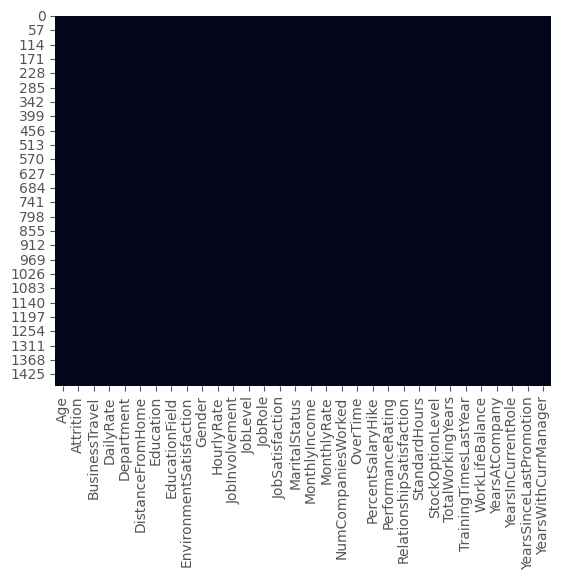

In [11]:
sns.heatmap(df.isna(), cbar=False) 

# [Step 3: Feature Understanding]()<a id="4"></a> <br>

- - Analyse target : (reg or classif) / (variables type:'numerical' or 'categorical') / (equilibre or not) classif non equilibre 10% of var1

<Axes: ylabel='proportion'>

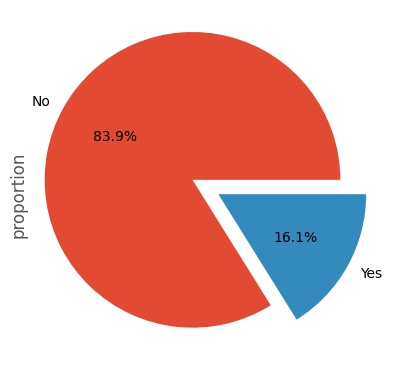

In [12]:
df['Attrition'].value_counts(normalize=True).plot.pie(autopct='%1.1f%%', explode =(0.2,0))

- - Histo des variables columns number : (distibution normale ou gausien symetrique or not) / uniforme / multi modale

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

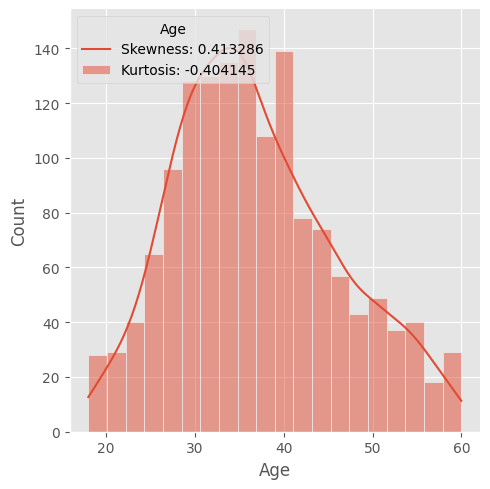

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

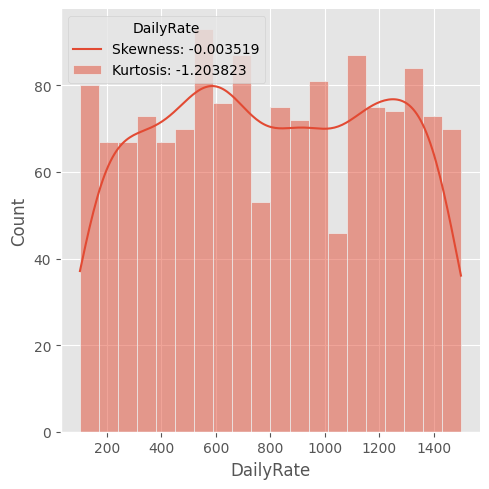

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

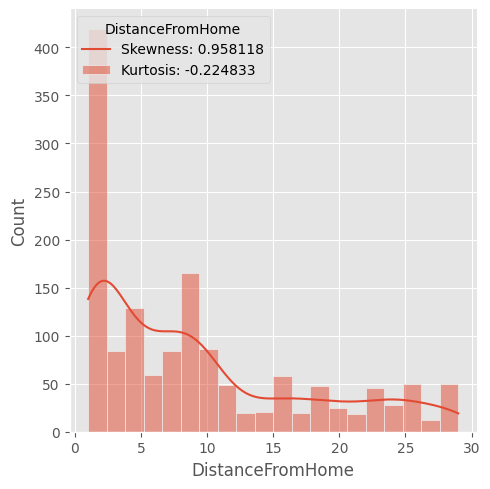

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

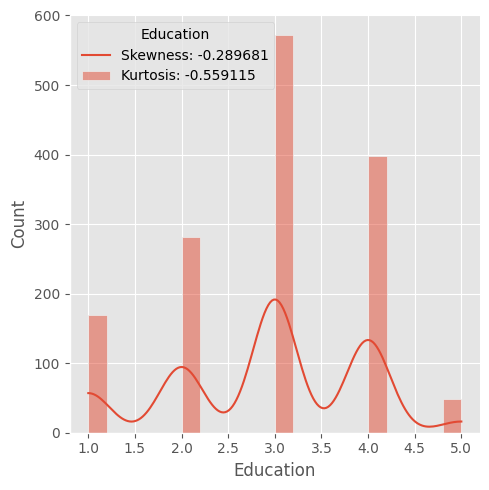

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

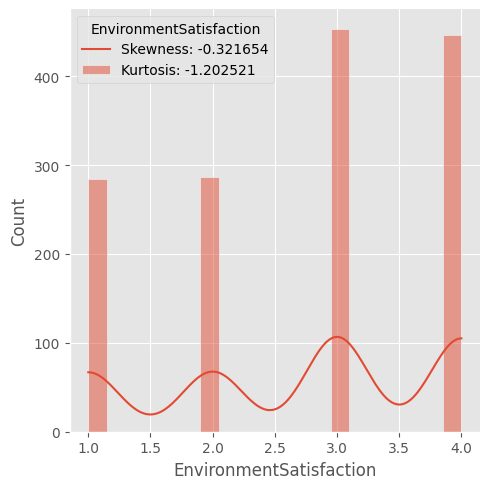

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

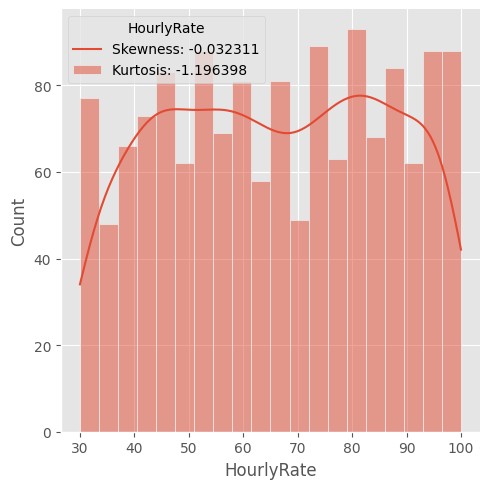

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

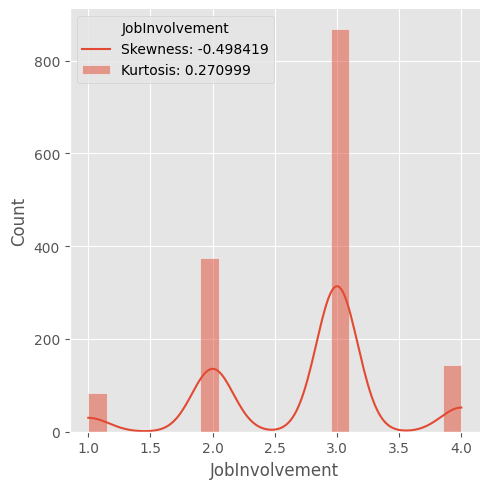

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

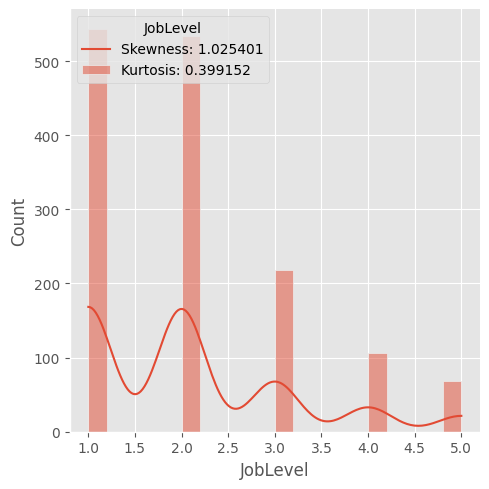

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

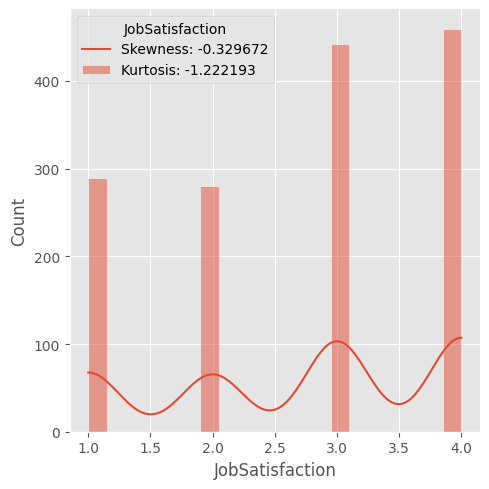

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

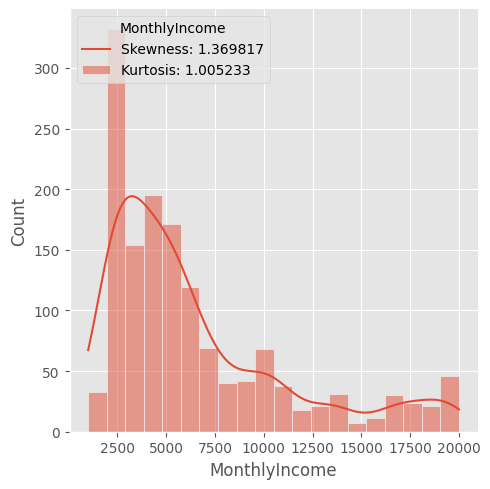

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

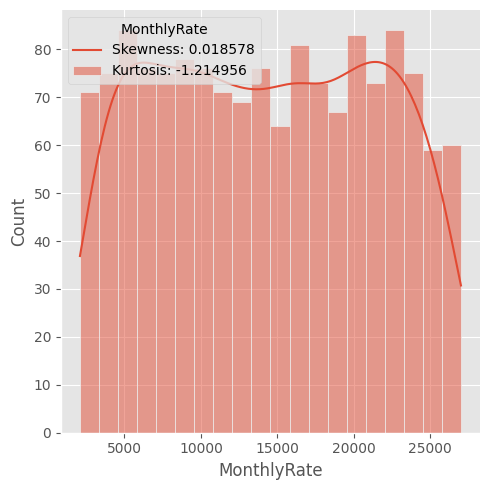

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

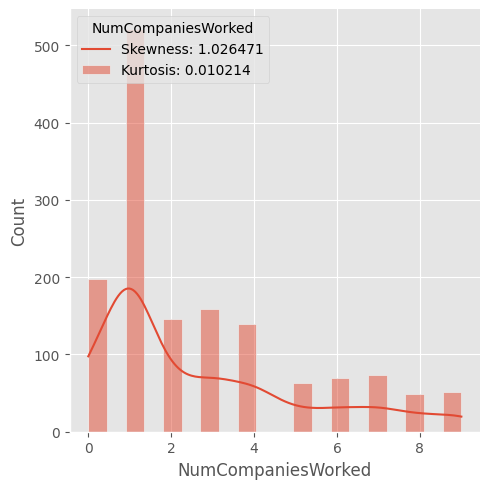

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

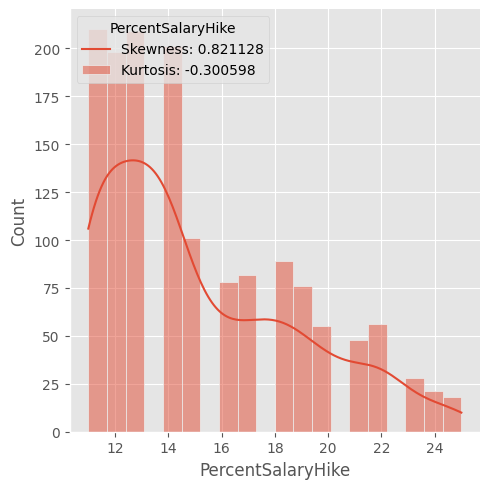

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

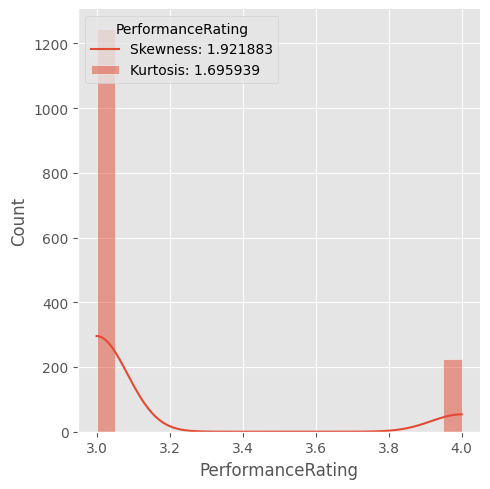

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

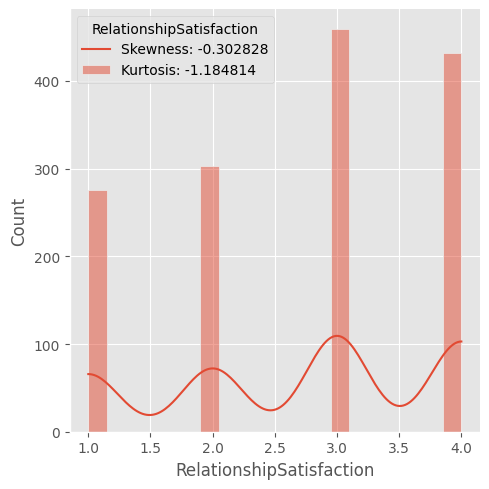

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

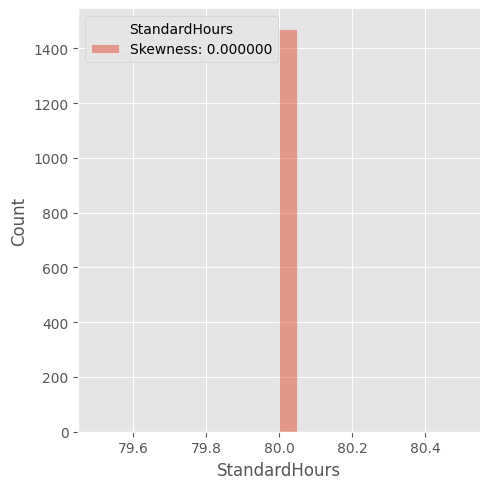

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

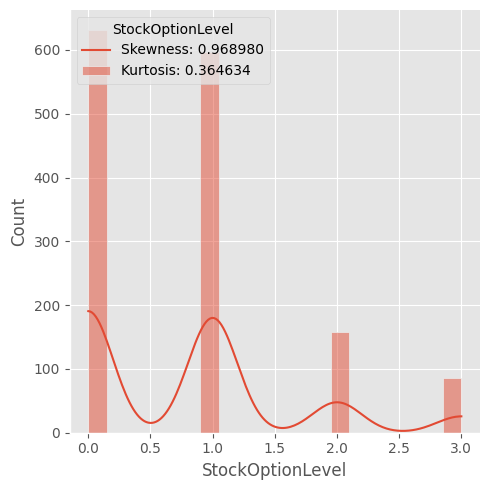

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

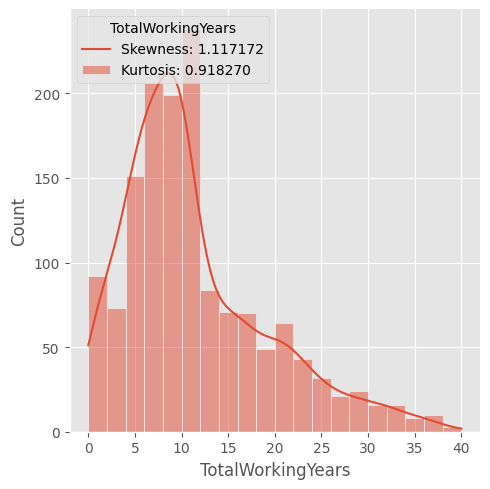

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

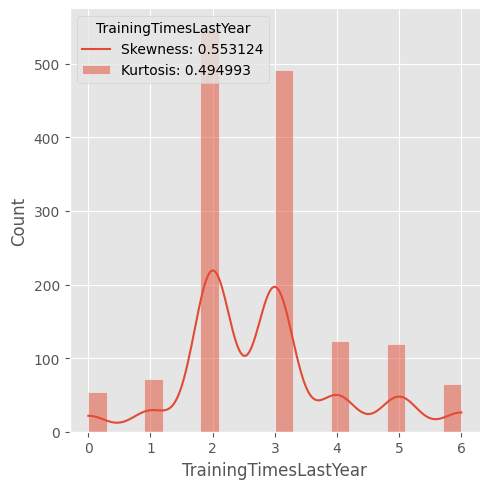

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

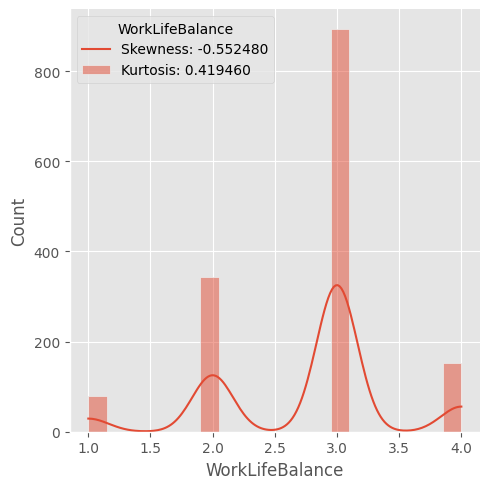

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

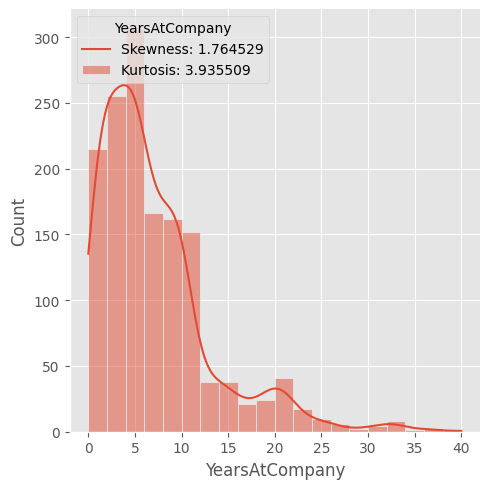

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

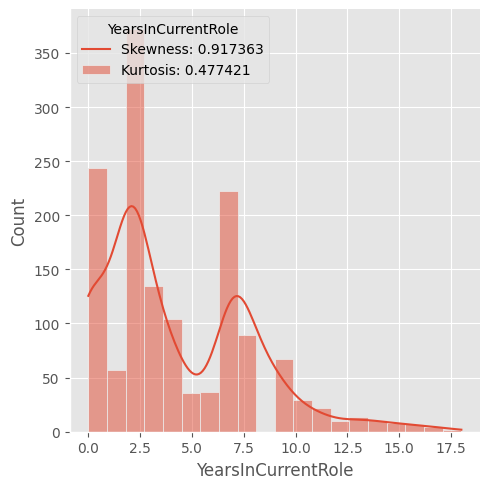

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

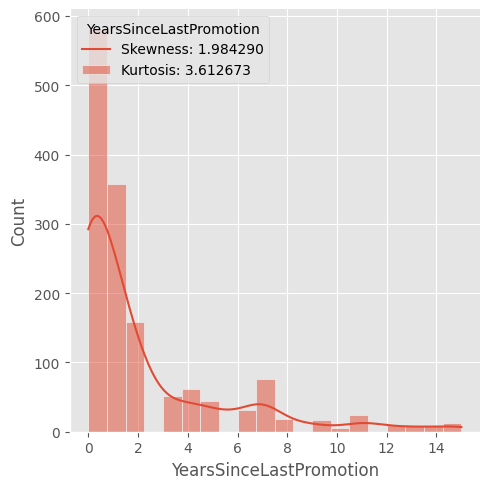

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


<Figure size 600x500 with 0 Axes>

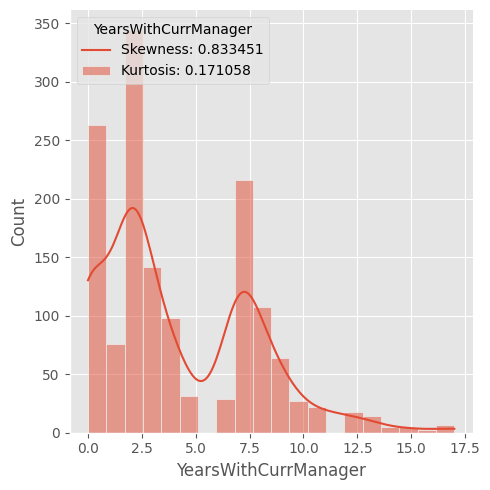

In [13]:
for col in df.select_dtypes(include=['int','float']):
    plt.figure(figsize=(6,5))
    ax = sns.displot(df, x=col,kde=True ,bins=20)
    plt.legend(title=col, loc='upper left', labels=["Skewness: %f" % df[col].skew(),"Kurtosis: %f" % df[col].kurt()])
    plt.show(ax)

- - Histo des variables columns object : (binaire(0,1) or not) / (equilibre or not)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Attrition----------------------------------------- ['Yes' 'No']


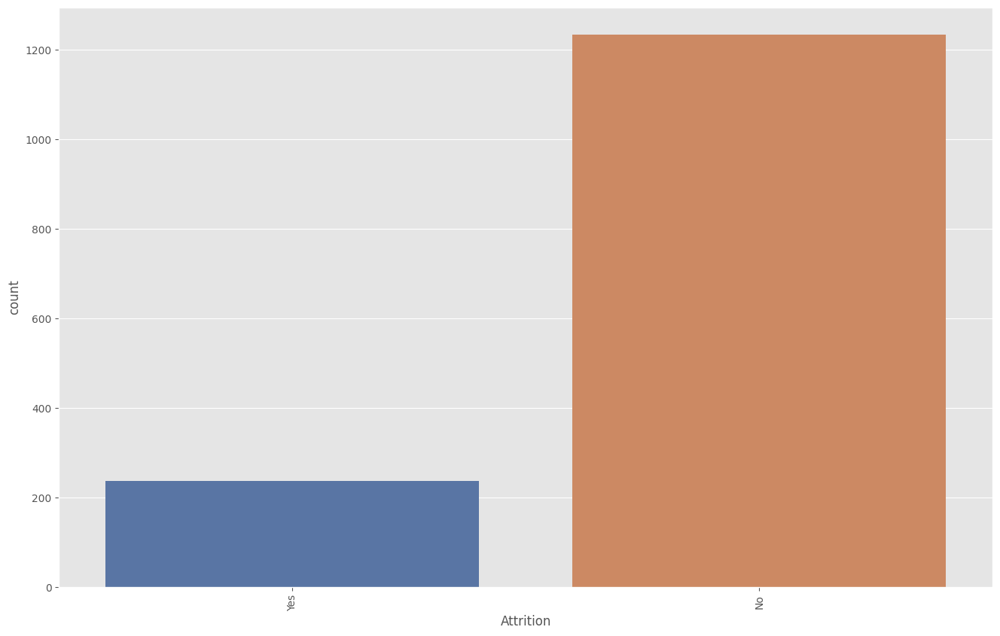

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


BusinessTravel------------------------------------ ['Travel_Rarely' 'Travel_Frequently' 'Non-Travel']


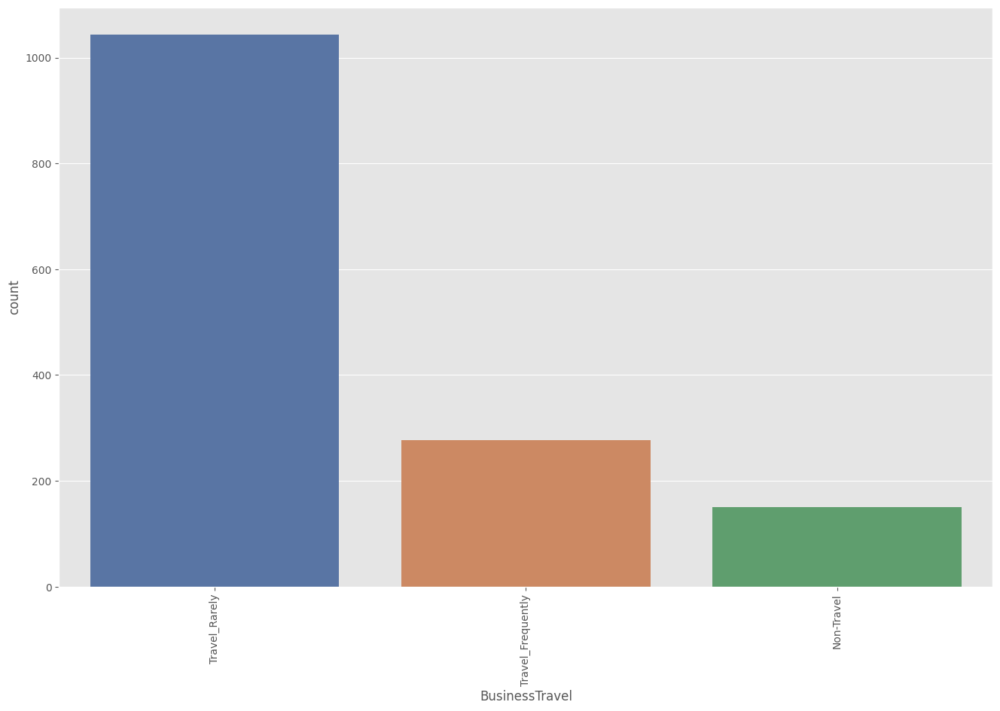

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Department---------------------------------------- ['Sales' 'Research & Development' 'Human Resources']


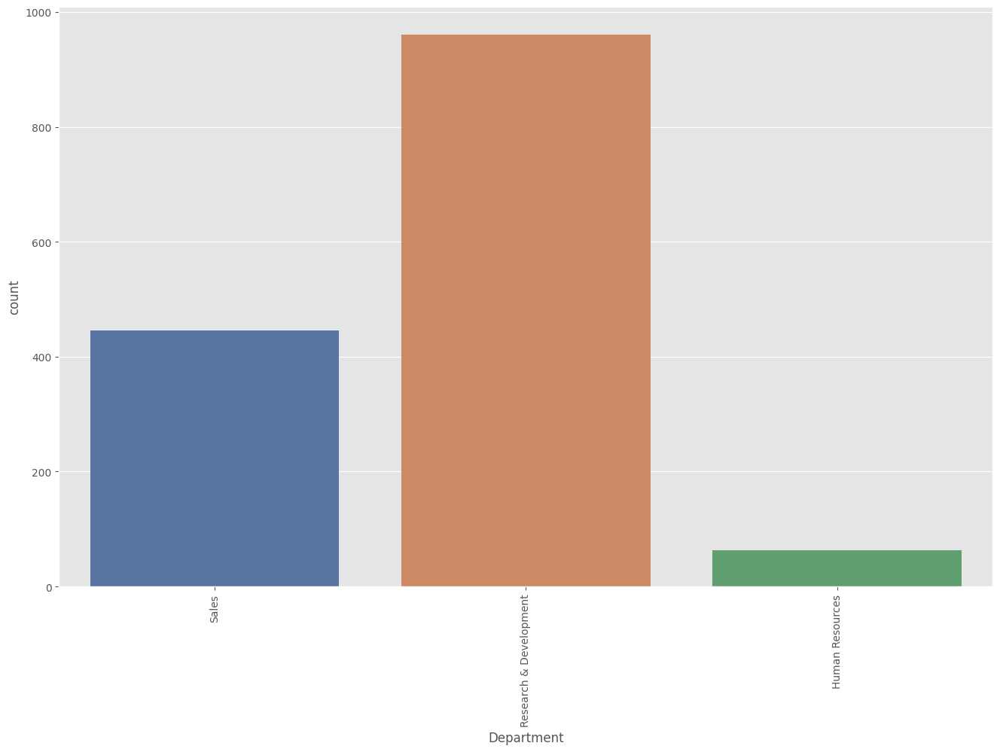

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


EducationField------------------------------------ ['Life Sciences' 'Other' 'Medical' 'Marketing' 'Technical Degree'
 'Human Resources']


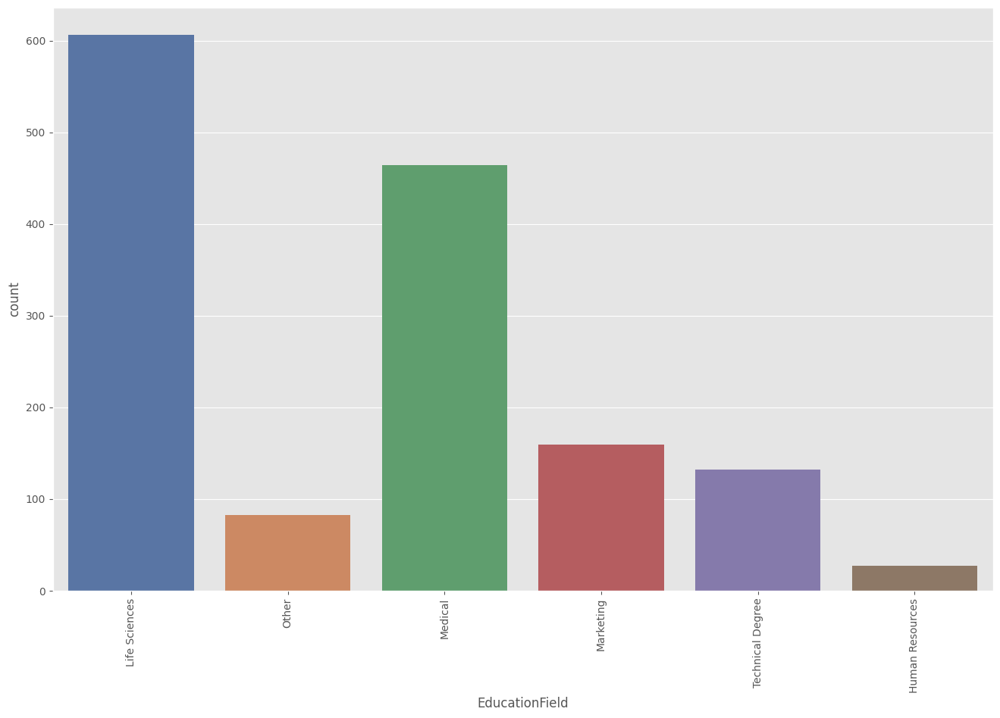

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Gender-------------------------------------------- ['Female' 'Male']


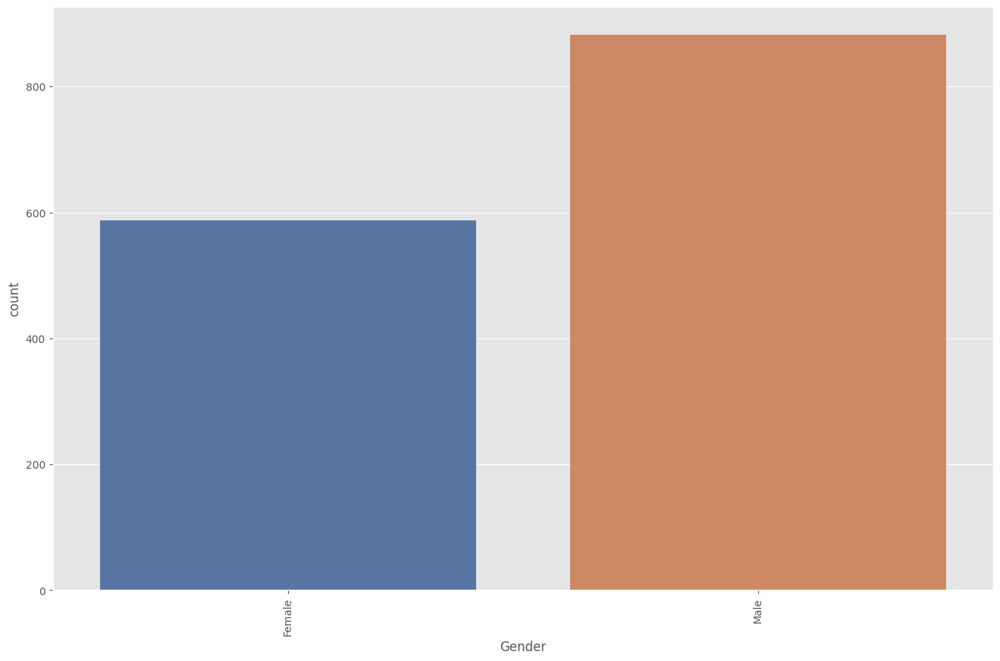

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


JobRole------------------------------------------- ['Sales Executive' 'Research Scientist' 'Laboratory Technician'
 'Manufacturing Director' 'Healthcare Representative' 'Manager'
 'Sales Representative' 'Research Director' 'Human Resources']


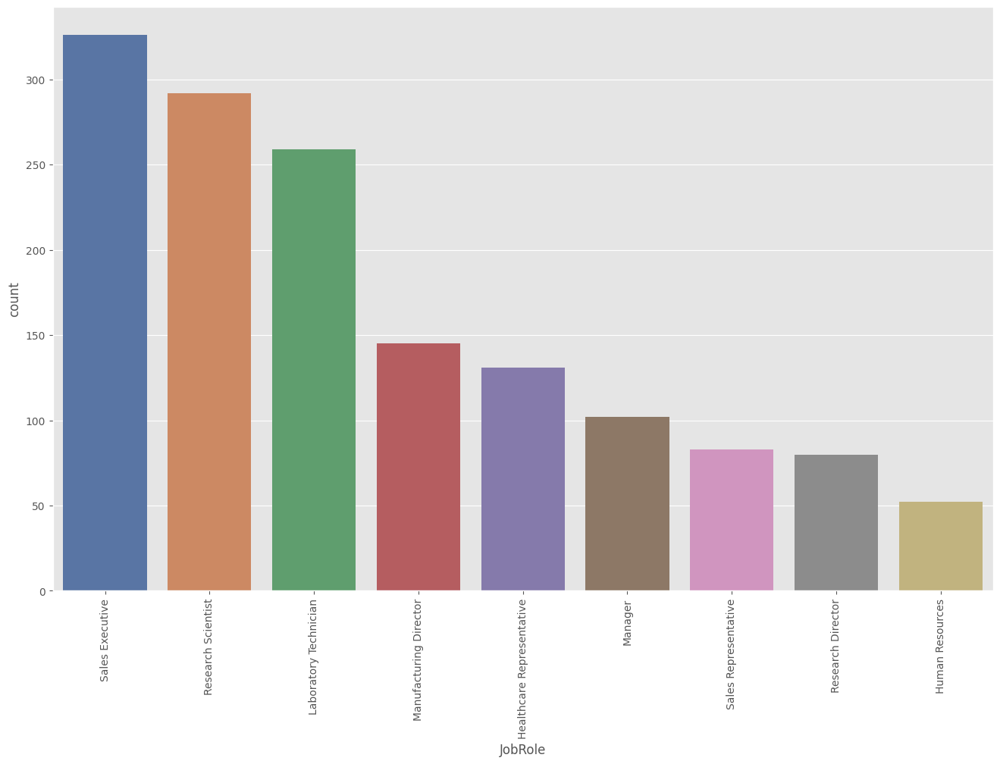

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


MaritalStatus------------------------------------- ['Single' 'Married' 'Divorced']


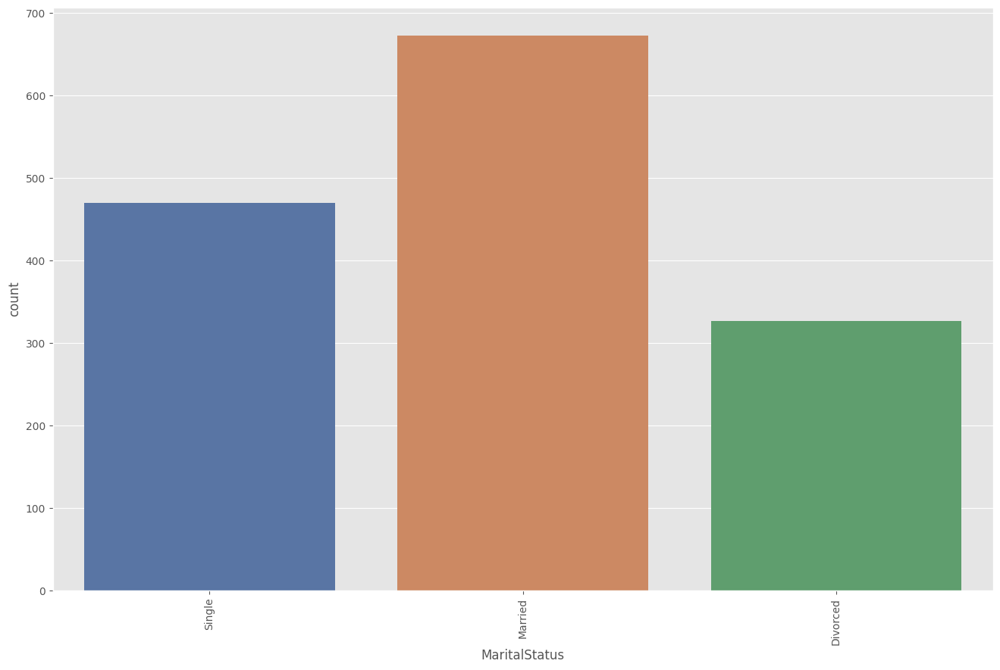

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


OverTime------------------------------------------ ['Yes' 'No']


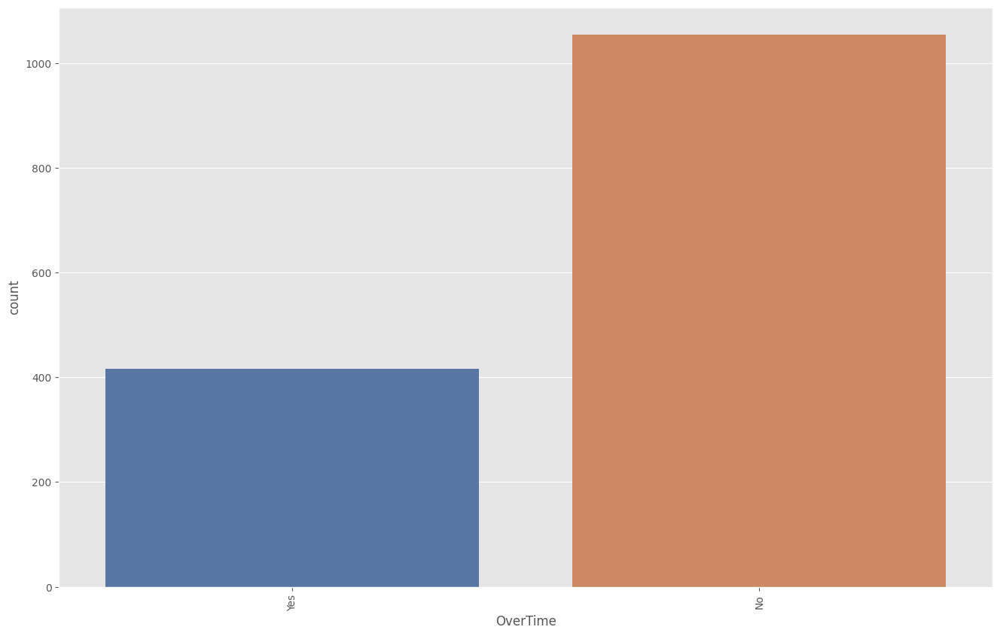

In [14]:
for col in df.select_dtypes('object'):
    print(f'{col :-<50} {df[col].unique()}')
    plt.figure(figsize = (16,10))
    ax = sns.countplot(x=df[col], hue=df[col], palette='deep')
    ax.legend().set_visible(False)
    plt.xticks(rotation=90)
    plt.show()

In [15]:
import plotly.express as px
fig = px.histogram(df, "Age", nbins=25, title='Age distribution', width=800)
fig.show()

- - Verifie outliers

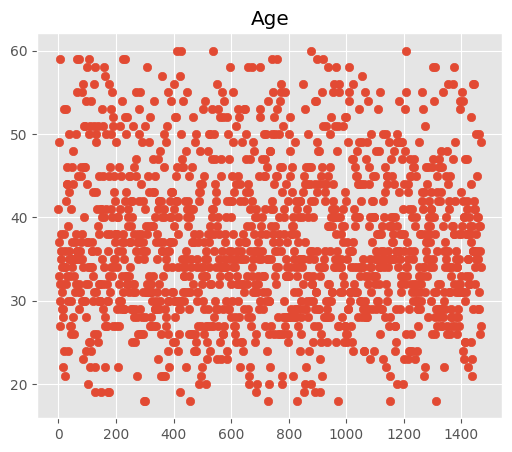

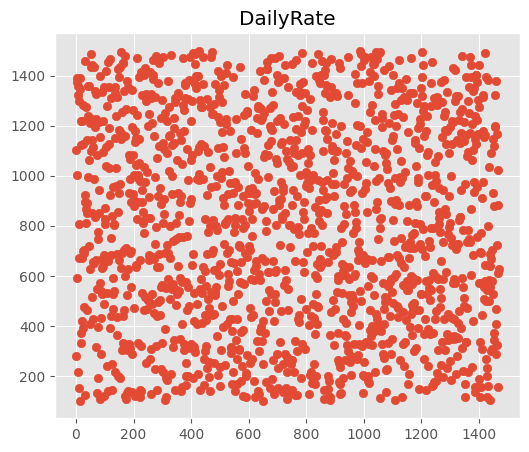

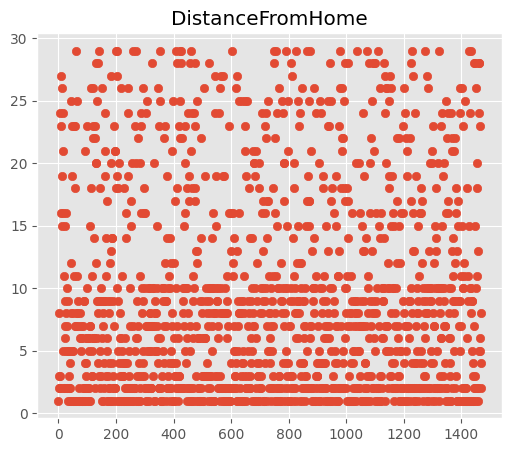

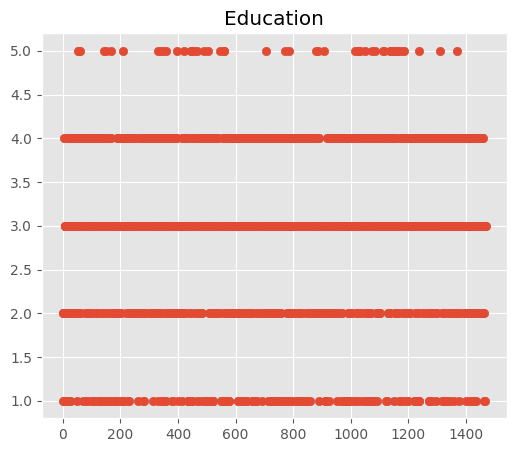

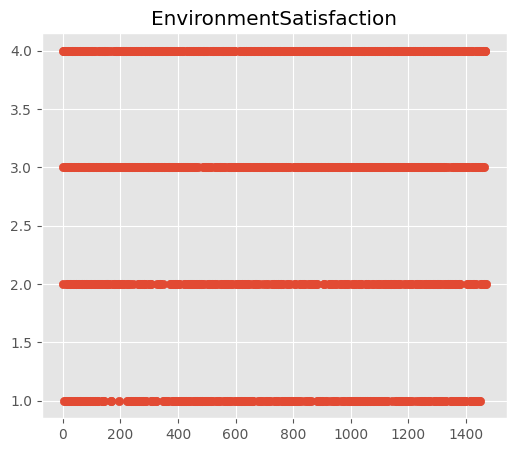

...

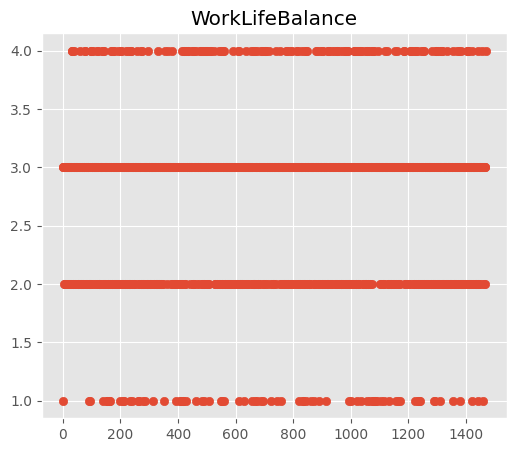

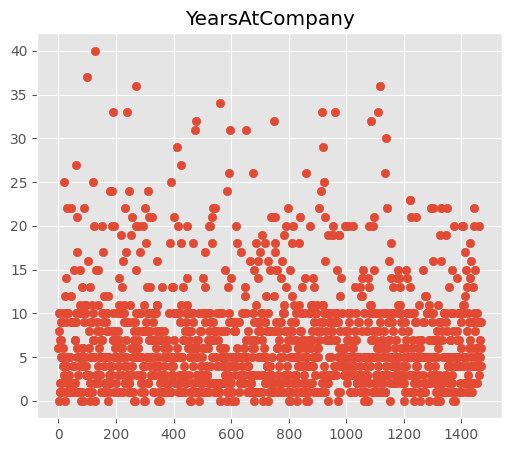

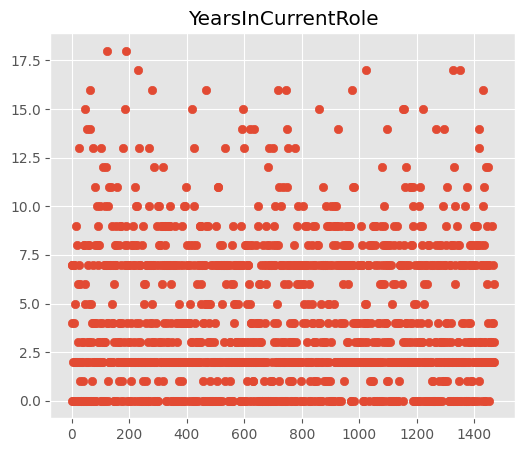

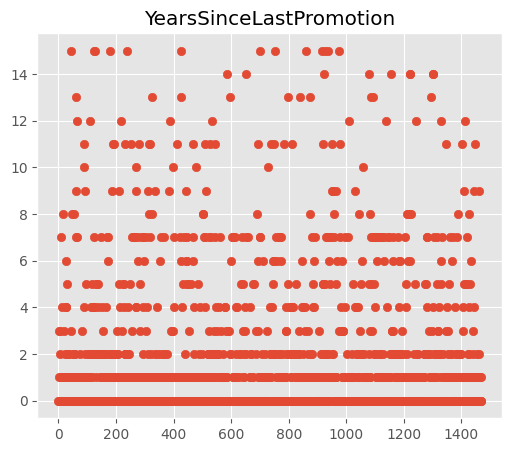

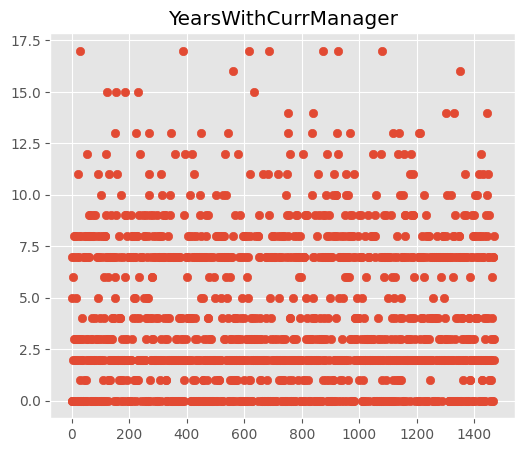

In [16]:
for col in df.select_dtypes(include=['int','float']):
    plt.figure(figsize=(6,5))
    ax = plt.scatter(df.index, df[col])
    plt.title(col)
    plt.show(ax)

# [Step 4: Feature Relationships]()<a id="5"></a> <br>

- - Relation variables/variables : (Taux de corre variables/variables>0.9)

<Axes: >

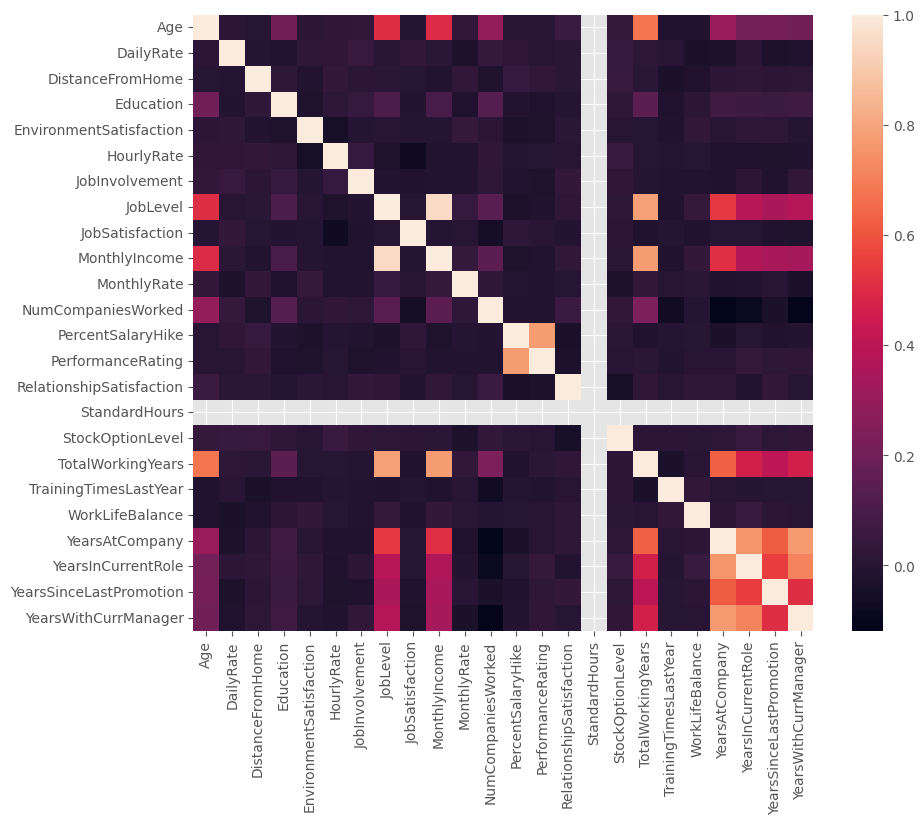

In [17]:
cols = list()
numeric_cols = df.select_dtypes(exclude='object').columns
df_corr = df[numeric_cols].dropna().corr()
plt.figure(figsize=(10,8))
sns.heatmap(df_corr, annot=False )

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\seaborn\axisgrid.py:123: UserWarning:

The figure layout has changed to tight



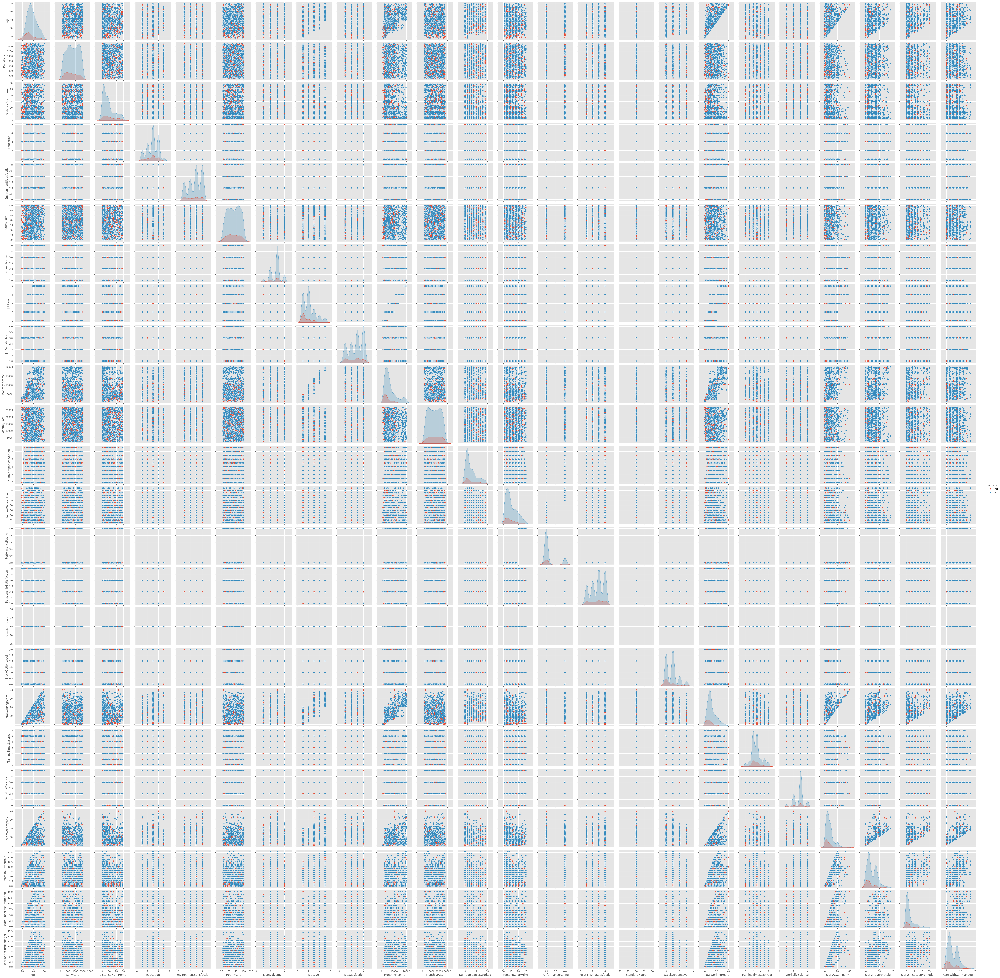

In [18]:
sns.pairplot(df, hue='Attrition')
plt.show()

- - Relation Target/Variables : (Taux corr variables/target >0.9) We ll try to understand how the target and other types variables relate.. 

C:\Users\Farouq MOUSMI\AppData\Local\Temp\ipykernel_30288\957011866.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



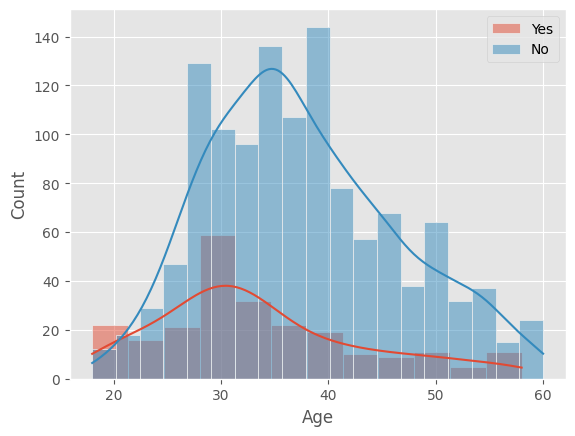

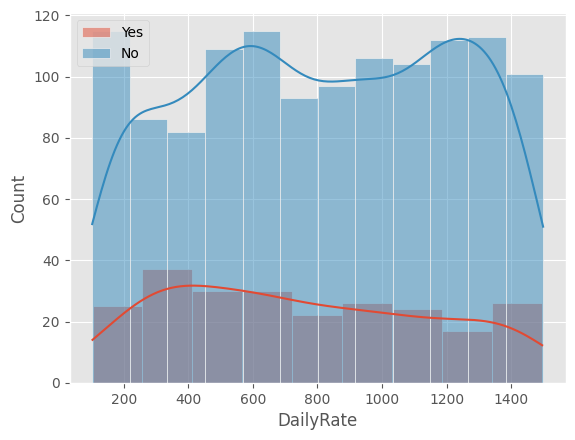

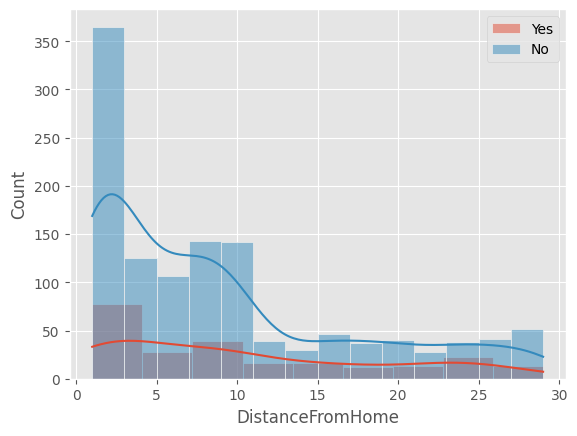

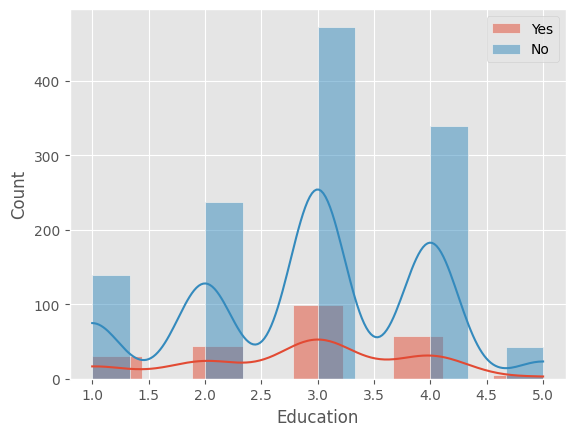

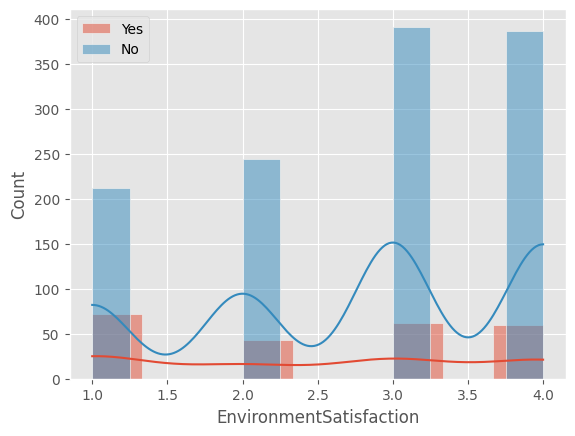

...

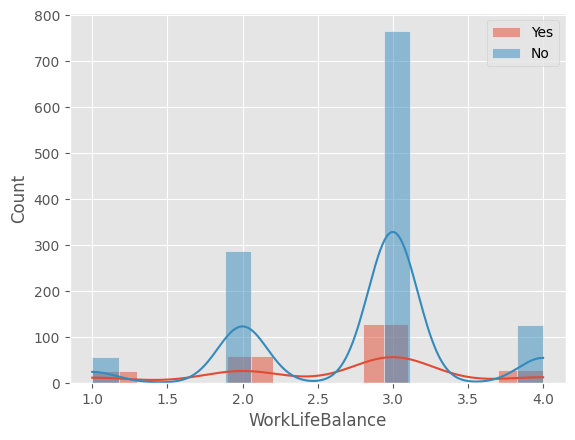

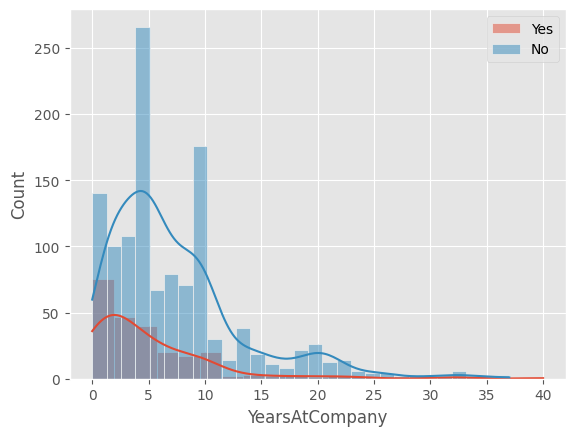

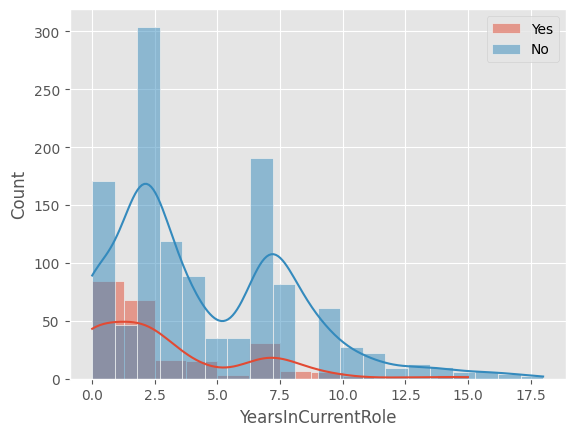

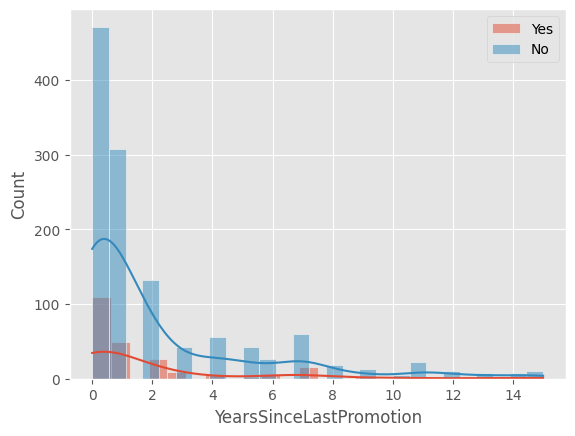

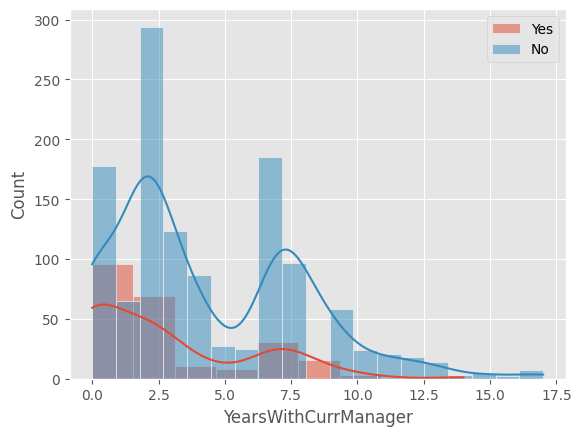

In [19]:
for col in df.select_dtypes(include=['float64','int']):
    plt.figure()                                 
    for cat in df['Attrition'].unique():
        #Data_A=Data[Data['column_y']==A]
        sns.histplot(df[df['Attrition']==cat][col],kde=True,label=cat)
    plt.legend()

C:\Users\Farouq MOUSMI\AppData\Local\Temp\ipykernel_30288\1640282161.py:2: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



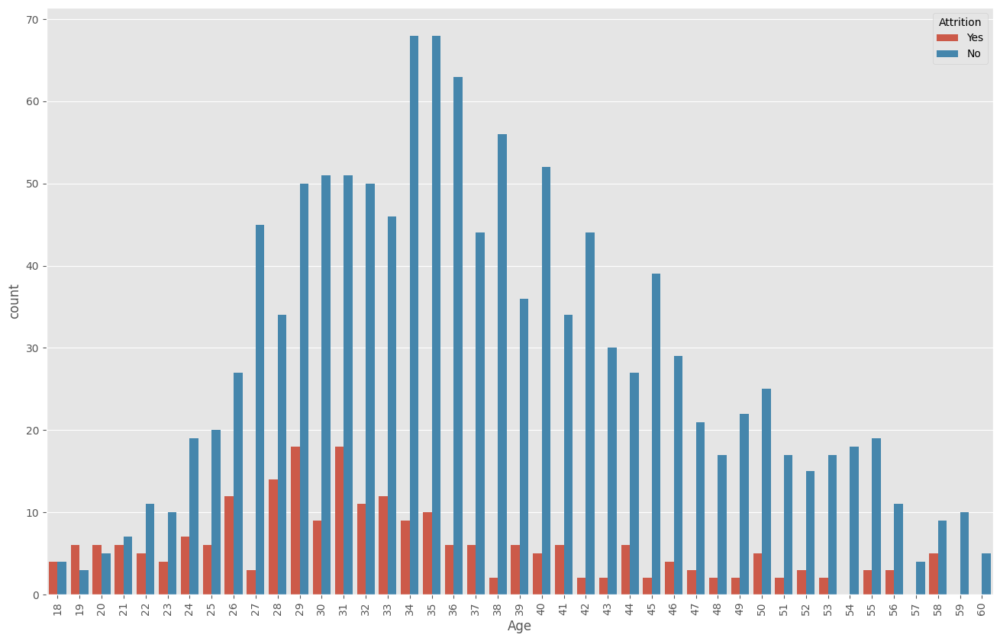

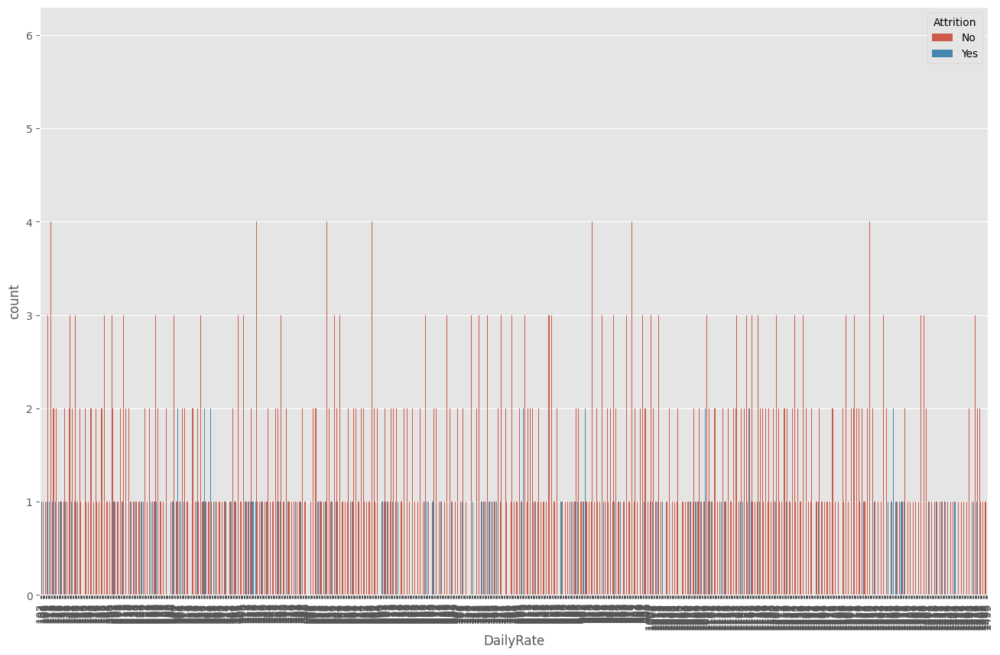

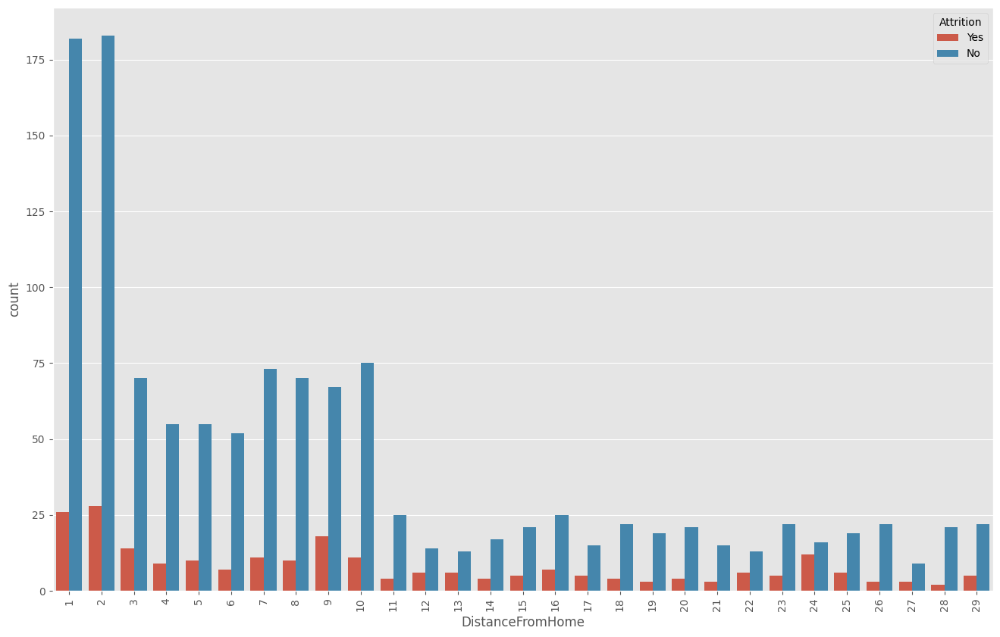

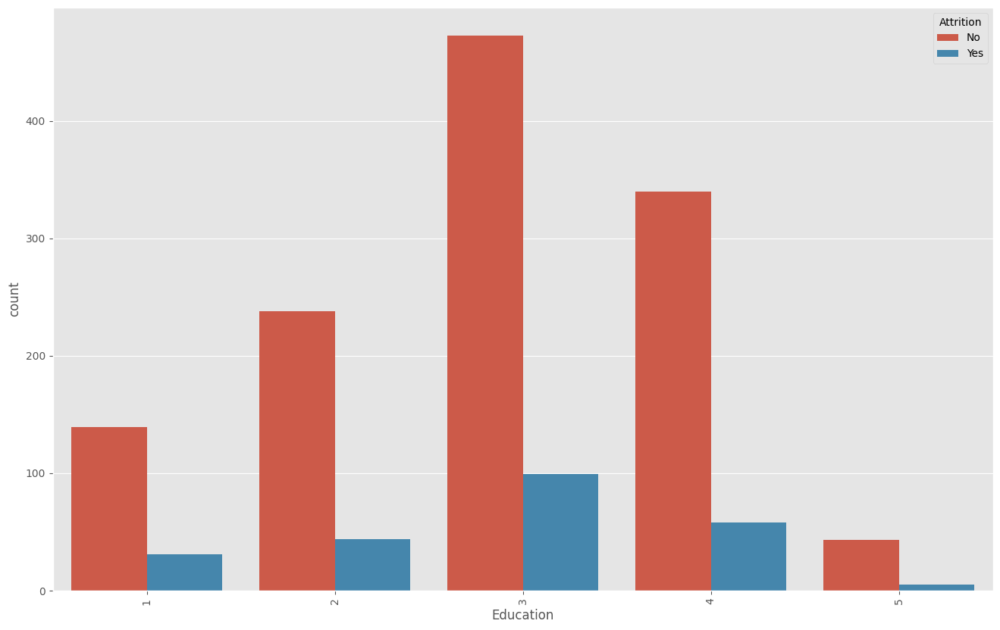

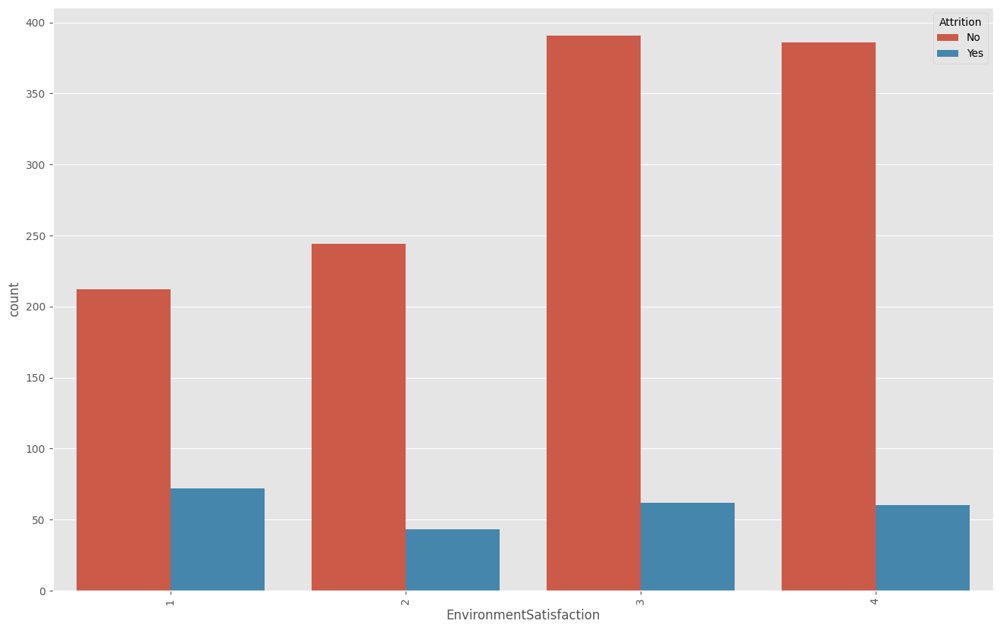

...

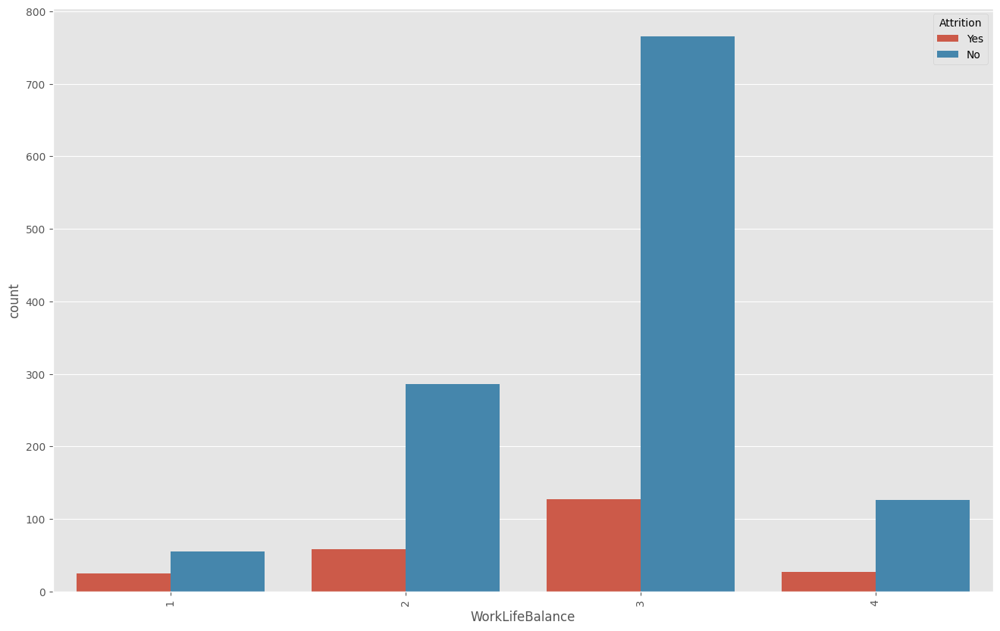

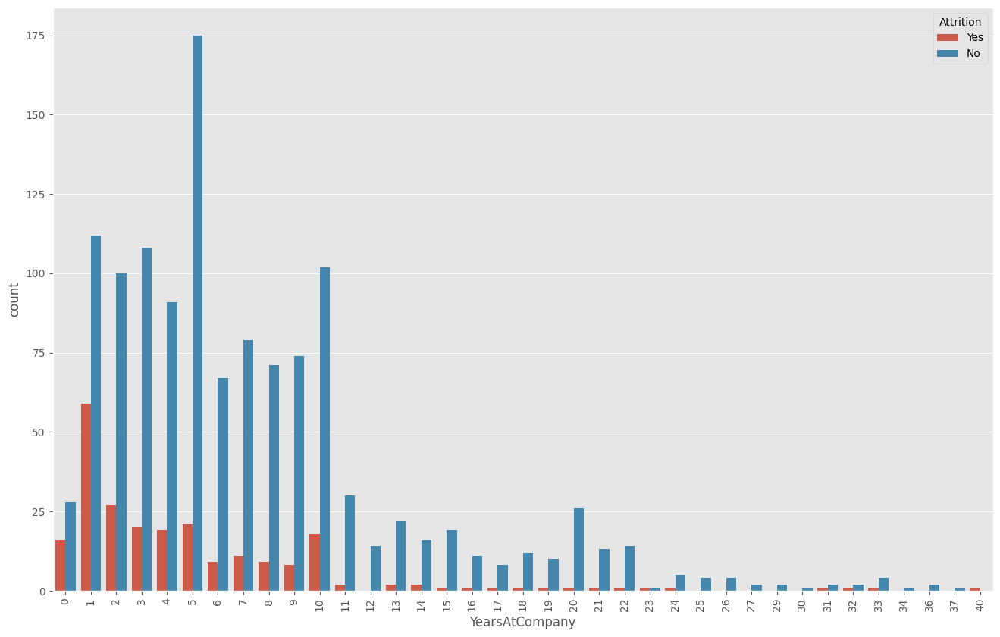

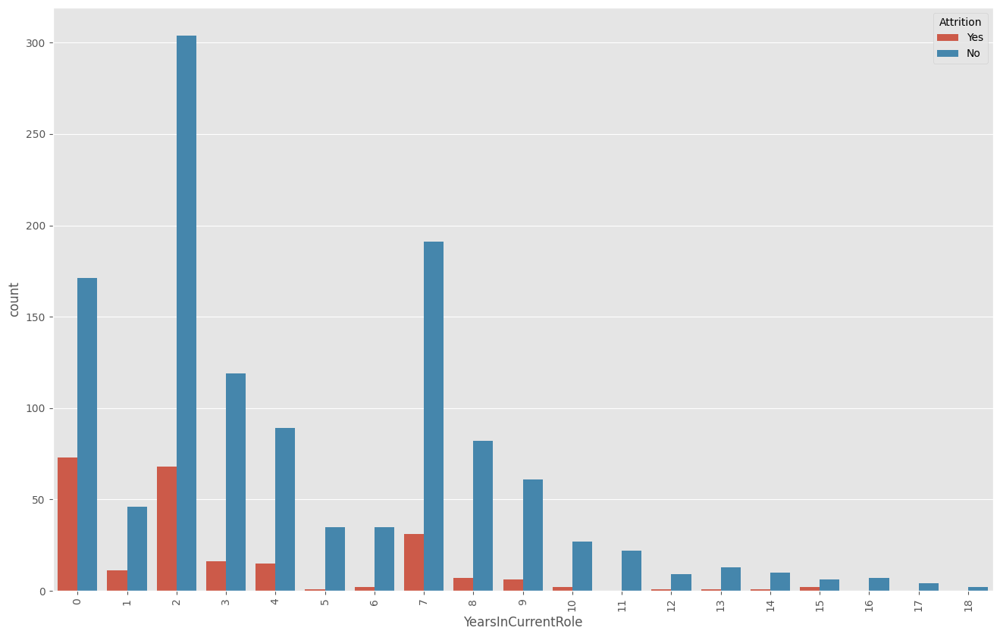

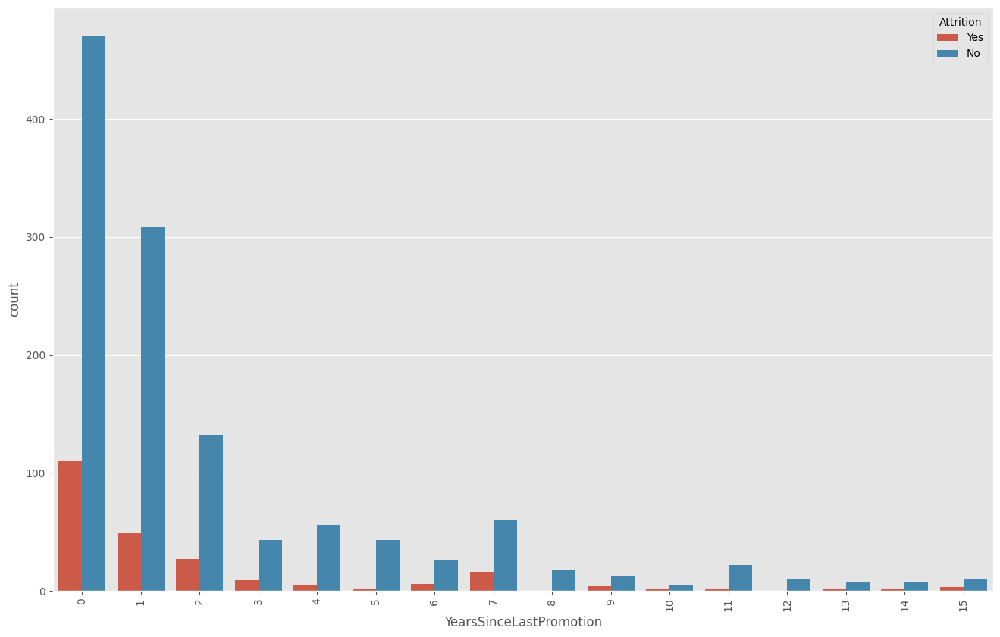

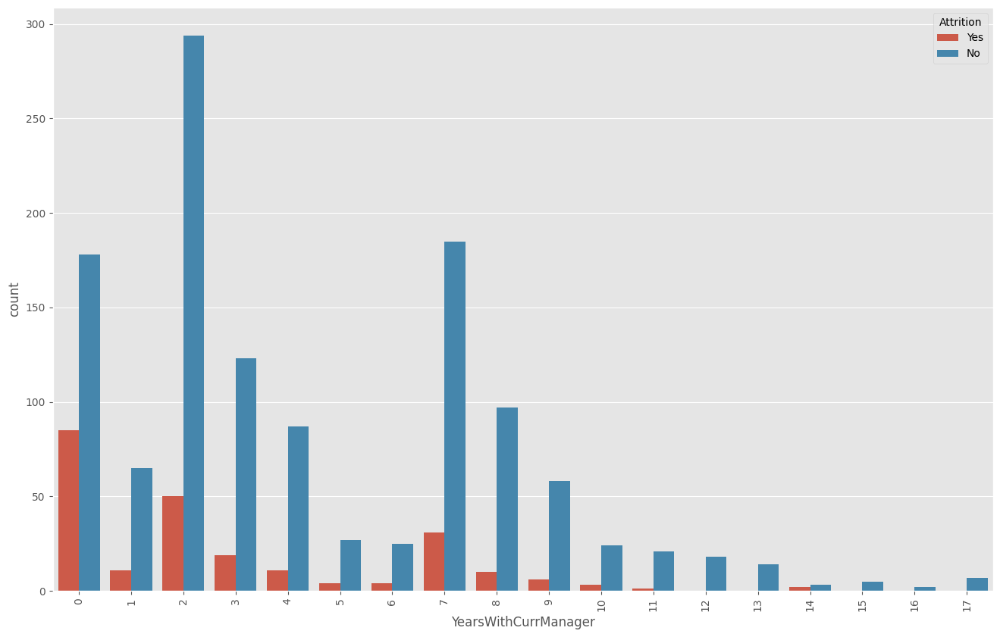

In [21]:
for col in df.select_dtypes(include=['int']):
    plt.figure(figsize = (16,10))
    ax = sns.countplot(data=df, x=col,hue=df['Attrition'])  
    plt.xticks(rotation=90)
    plt.show      

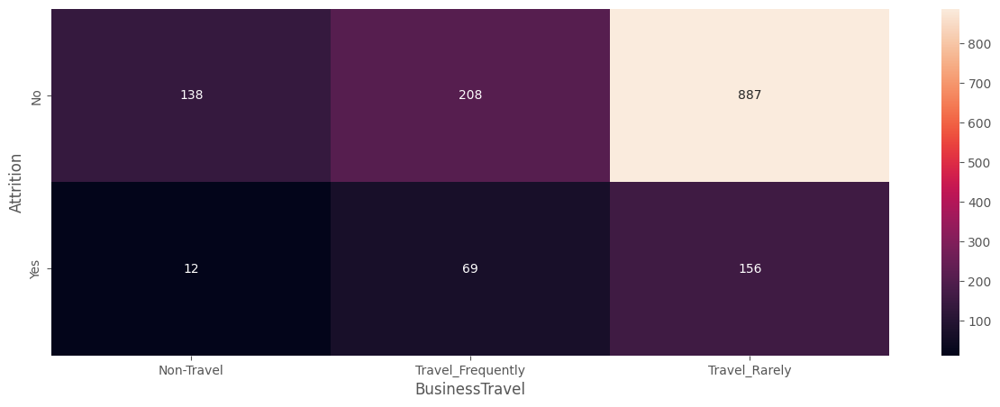

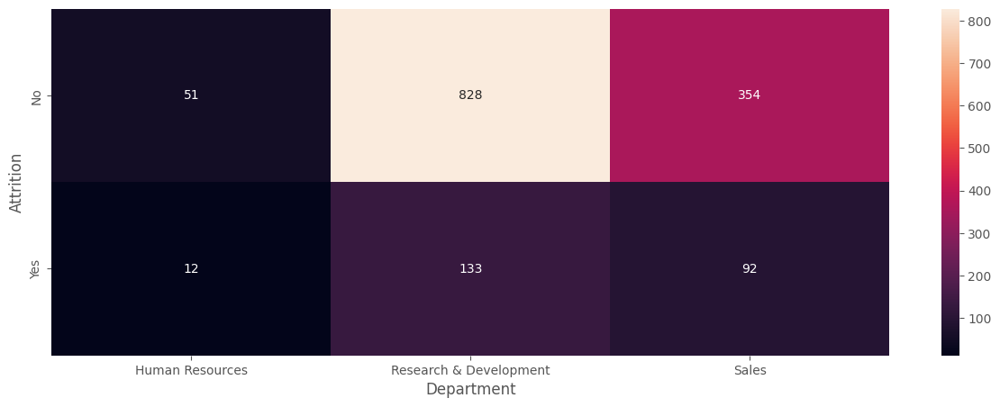

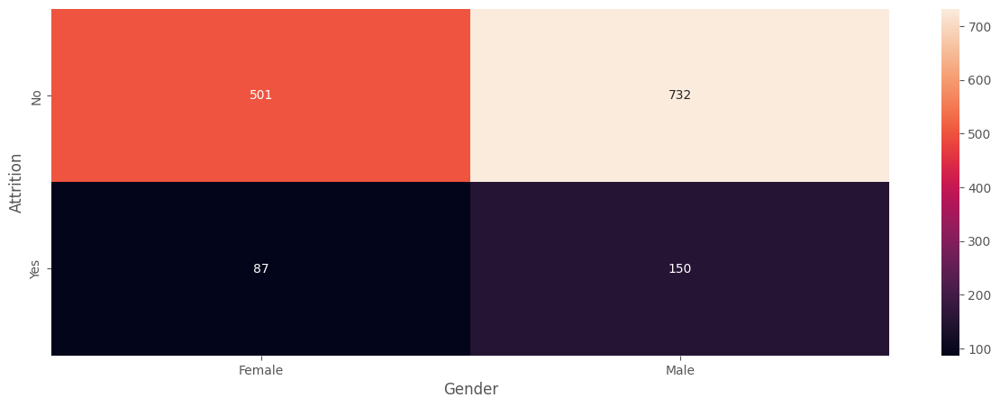

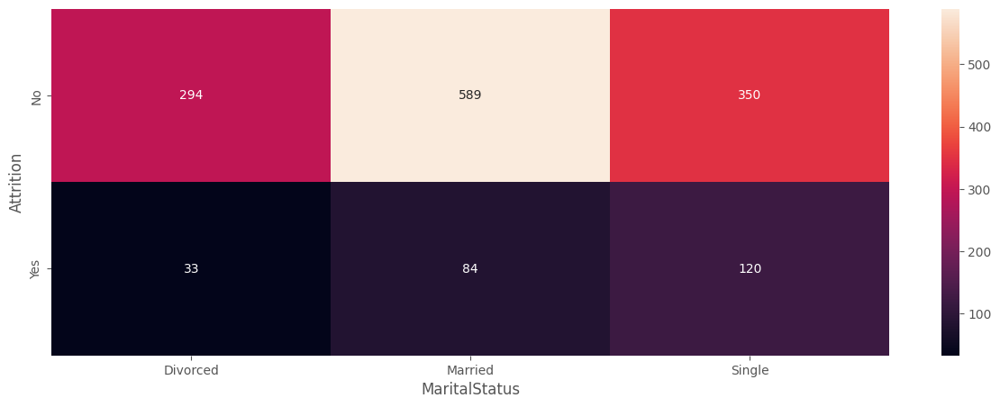

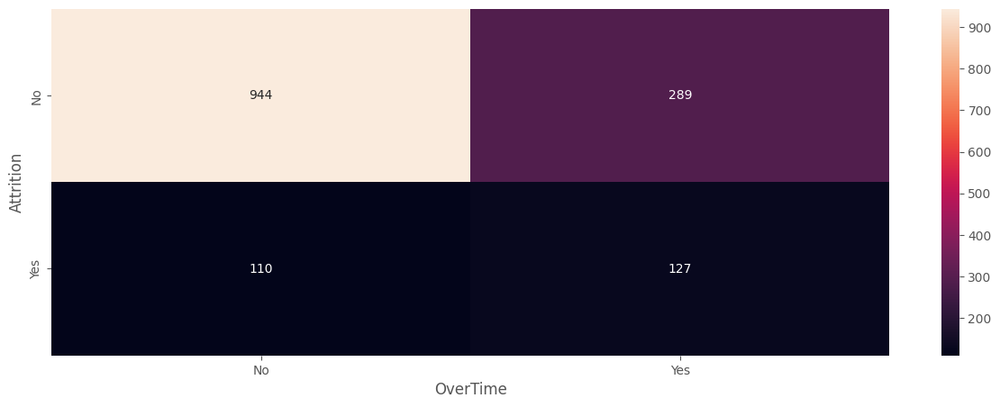

In [22]:
for col in df.select_dtypes(include=['object']):
    if len(df[col].unique()) <4 and col != 'Attrition' :
            plt.figure(figsize=(15,5))
            sns.heatmap(pd.crosstab(df['Attrition'],df[col]), annot=True, fmt='d')   

- - Relation Column/Column : (very usefull)

# [Step 5: Analyse Hypothese]()<a id="6"></a> <br>

- - Rate of 'columns_y' depending to each col => prove if the rate of 'column_y' are not equal

In [24]:
from scipy.stats import ttest_ind                                                            
def t_test(col):
    alpha=0.02
    #=>array[True, False]           
    index_A=df['Attrition']=="No"
    index_B=df['Attrition']=="Yes"    
    #=>Data_A=Data[rows['column_y']==A] 
    if pd.api.types.is_numeric_dtype(df[col]):
        Data_A = df[index_A]
        Data_B = df[index_B]
        # dropna for eliminating NaN values for the test
        stat, p = ttest_ind(Data_A[col].dropna(), Data_B[col].dropna())                           
        if p < alpha:
            return 'H0 Rejected X'  # col has a rate not equal for 'column_y' => col has an impact on column_y
        else:
            return 'H0 Not Rejected'  # col has no significant impact on column_y
    else:
        return 'Not Numeric'  # The column is not numeric   

for col in df.columns:
    print(f'{col :-<50} {t_test(col)}')

Age----------------------------------------------- H0 Rejected X
Attrition----------------------------------------- Not Numeric
BusinessTravel------------------------------------ Not Numeric
DailyRate----------------------------------------- H0 Not Rejected
Department---------------------------------------- Not Numeric
DistanceFromHome---------------------------------- H0 Rejected X
Education----------------------------------------- H0 Not Rejected
EducationField------------------------------------ Not Numeric
EnvironmentSatisfaction--------------------------- H0 Rejected X
Gender-------------------------------------------- Not Numeric
HourlyRate---------------------------------------- H0 Not Rejected
JobInvolvement------------------------------------ H0 Rejected X
JobLevel------------------------------------------ H0 Rejected X
JobRole------------------------------------------- Not Numeric
JobSatisfaction----------------------------------- H0 Rejected X
MaritalStatus------------------

c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\scipy\stats\_axis_nan_policy.py:523: RuntimeWarning:

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.



# [Step 6 : Data Cleaning]()<a id="7"></a> <br>

- Encodage : (Only for object column)

In [25]:
from sklearn.preprocessing import LabelEncoder
def encodage(data):
    cod_dict = {}
    for col in data.select_dtypes('object'):
        cod_dict[col] = LabelEncoder()
        print(cod_dict.keys())
        print('classed found : ' , list(cod_dict[col].fit(data[col]).classes_))
        #Create a label (category) encoder object
        data[col] = cod_dict[col].fit_transform(data[col])
        print('Updates dataframe is : \n' ,data )
    #for inverse transform not important
    # data['score0'] = cod_dict['score0'].inverse_transform(data['score0'])         
    # print('Inverse Transform  : \n' ,data)
    return data

- - Train_test_split

<Axes: title={'center': 'Data_test'}, ylabel='count'>

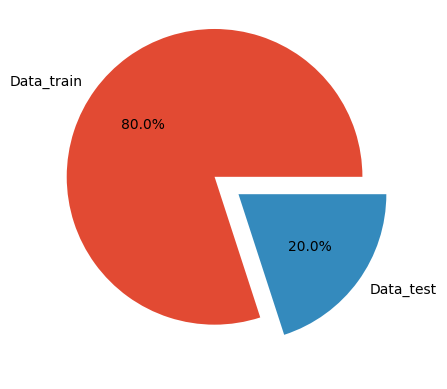

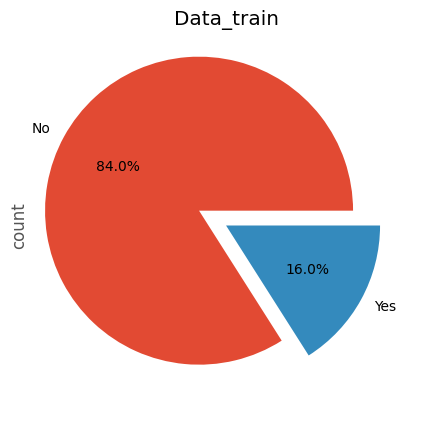

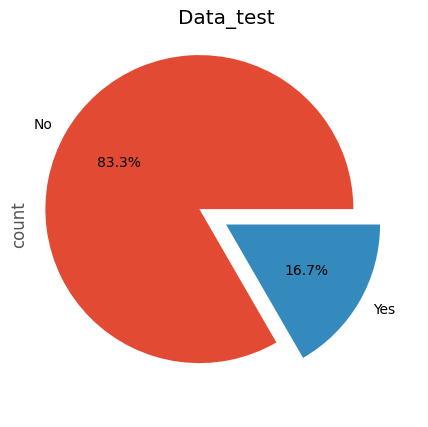

In [26]:
from sklearn.model_selection import train_test_split
Data_train , Data_test = train_test_split(df, test_size=0.2, random_state=0)
#chek if train_size==1-0.2 of all rows
plt.pie((Data_train.shape[0],Data_test.shape[0]), labels=('Data_train', 'Data_test'), autopct='%1.1f%%', explode =(0.2,0))
################################################(use it only for object target class )
#chek train['column_y'] class equilibre or not 
plt.figure(figsize=(15,5))
plt.title('Data_train')
Data_train['Attrition'].value_counts().plot.pie(autopct='%1.1f%%', explode =(0.2,0))
#chek test['column_y'] class equilibre or not
plt.figure(figsize=(15,5))
plt.title('Data_test')
Data_test['Attrition'].value_counts().plot.pie(autopct='%1.1f%%', explode =(0.2,0))

In [27]:
from sklearn.preprocessing import StandardScaler
def prep(data):
    # only for column object use it
    data = encodage(data)   
    # alwayse use it
    X = data.drop('Attrition',axis=1)
    y = data['Attrition']
    return X,y
X_train, y_train = prep(Data_train)
X_test, y_test = prep(Data_test)

dict_keys(['Attrition'])
classed found :  ['No', 'Yes']
Updates dataframe is : 
       Age  Attrition     BusinessTravel  DailyRate              Department  \
1374   58          0      Travel_Rarely        605                   Sales   
1092   45          0      Travel_Rarely        950  Research & Development   
768    40          0      Travel_Rarely        300                   Sales   
569    36          0         Non-Travel       1434                   Sales   
911    25          1  Travel_Frequently        599                   Sales   
...   ...        ...                ...        ...                     ...   
763    34          0      Travel_Rarely       1333                   Sales   
835    35          0      Travel_Rarely        528         Human Resources   
1216   43          0      Travel_Rarely       1179                   Sales   
559    38          0      Travel_Rarely        268  Research & Development   
684    40          0      Travel_Rarely        658           

# [Step 7: Model Building (If Applicable):]()<a id="8"></a> <br>

- Train the model

In [28]:
from sklearn.tree import DecisionTreeClassifier
model = DecisionTreeClassifier()
model.fit(X_train, y_train)

DecisionTreeClassifier()

# [Step 8: Model Evaluation:]()<a id="9"></a> <br>
- Evaluate the model's performance on the testing set using relevant metrics.

In [29]:
score = model.score(X_test,y_test)
print(score)
y_pred = model.predict(X_test)

0.7551020408163265


accuracy_score :  0.7551020408163265
confusion_matrix :  [[207  38]
 [ 34  15]]
f1_score :  0.7551020408163265
classification_report :                precision    recall  f1-score   support

           0       0.86      0.84      0.85       245
           1       0.28      0.31      0.29        49

    accuracy                           0.76       294
   macro avg       0.57      0.58      0.57       294
weighted avg       0.76      0.76      0.76       294

recall_score :  [0.84489796 0.30612245]
precision_score :  [0.85892116 0.28301887]


<Axes: >

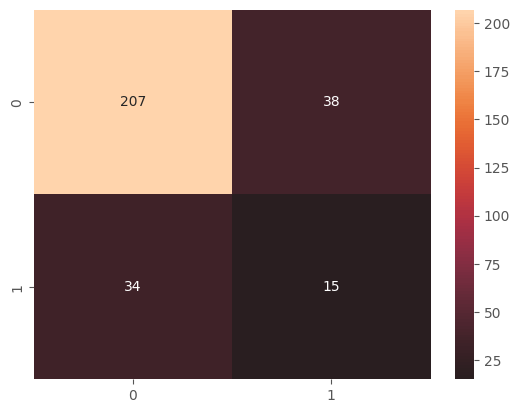

In [30]:
from sklearn.metrics import precision_score, accuracy_score,confusion_matrix, f1_score, recall_score, precision_recall_curve, classification_report

def scoring(y_test,y_pred):
    # Accuracy : acc= -((y-y_pred)**2/(y-y_mean)**2)  #this model describe in % the variation of y
    acc=accuracy_score(y_test, y_pred)        

    #best score is with Diagonal matrix   #visualisation of result               [[TP FP]
    cm = confusion_matrix(y_test, y_pred)                                        #[FN TN]]        

    # F1 Score : 2*(precision*recall)/(precision +recall) #average= can be : None,binary,micro,weighted,samples
    f1 = f1_score(y_test, y_pred, average='micro')         

    # Classification report :    #get (accuracy acc, score f1, cm)
    cr = classification_report(y_test,y_pred)

    # Recall Score : (Sensitivity) (TP / float(TP + FN)) == 1/1+2  #average= can be : None,binary,macro,weighted,samples
    rs = recall_score(y_test, y_pred, average=None)        

    # Precision Score : (Specificity) (TP / float(TP + FP))
    ps = precision_score(y_test, y_pred, average=None)
    return acc,cm,f1,cr,rs,ps

#compare (accuracy acc, score f1, cm)
scoring(y_test,y_pred)              
print("accuracy_score : " , scoring(y_test,y_pred)[0])
print("confusion_matrix : ",  scoring(y_test,y_pred)[1] )
print("f1_score : " , scoring(y_test,y_pred)[2] )
print("classification_report : " , scoring(y_test,y_pred)[3] )
print("recall_score : " , scoring(y_test,y_pred)[4] )
print("precision_score : " , scoring(y_test,y_pred)[5] )
#visualisation of result : best score is with Diagonal matrix
cm = scoring(y_test,y_pred)[1] 
sns.heatmap(cm, center=True, annot=True, fmt="d") 

# [Step 9: Make Pipline:]()<a id="10"></a> <br>

In [31]:
def prep2(data):
    # alwayse use it
    X = data.drop('Attrition',axis=1)
    y = data['Attrition']
    return X,y
X_train, y_train = prep2(Data_train)
X_test, y_test = prep2(Data_test)

In [86]:
from sklearn.preprocessing import PolynomialFeatures,RobustScaler, StandardScaler,OneHotEncoder
#MinMaxScaler,[Normalizer(copy=True, norm=''l1'or'max'')modif suivant row,MaxAbsScaler(copy=True)modif suivant columns,FunctionTransformer(func=fun1 or lambda x: x**0.1,validate = True),Binarizer(threshold = 1.0),
from sklearn.impute import SimpleImputer,KNNImputer,MissingIndicator

from sklearn.compose import make_column_transformer
from sklearn.pipeline import make_pipeline, make_union

# Use of all models in order to eliminate overfitting => RadForst, AdBoost, SVM, KNN 
num_features = [col for col in df.select_dtypes(exclude=['object']) if col != 'Attrition']
categ_features = [col for col in df.select_dtypes(include=['object']) if col != 'Attrition']
#Eliminate nan val+StandardScaler
num_pipeline_norm = make_pipeline(KNNImputer(),RobustScaler())
#pas besoin de normalisation (RobustScaler()) (SimpleImputer(missing_values=np.nan, strategy='mean',fill_value=-9)
num_pipeline = make_pipeline(KNNImputer())
# strategy = 'most_frequent',mean,median,constant with fill_value=-99
categ_pipeline = make_pipeline(KNNImputer(),OneHotEncoder())

preprocessor_norm = make_column_transformer((num_pipeline_norm,num_features),(categ_pipeline,categ_features))
preprocessor = make_column_transformer((num_pipeline,num_features),(categ_pipeline,categ_features))
#Model Classificat#=================================#=========================================
import xgboost as xgb
mod_XGB = make_pipeline(preprocessor_norm,PolynomialFeatures(),xgb.XGBClassifier())
from sklearn.linear_model import LogisticRegression,SGDClassifier
mod_LOG = make_pipeline(preprocessor_norm,PolynomialFeatures(),LogisticRegression(penalty='l2',solver='sag',C=1.0,random_state=33))
mod_SGD = make_pipeline(preprocessor_norm,PolynomialFeatures(),SGDClassifier(random_state=0))
from sklearn.svm import SVC
mod_SVM = make_pipeline(preprocessor_norm,PolynomialFeatures(), SVC(random_state=0))         #must use Scaling standard => -1< X_train <1 & mean=0 & std=1
from sklearn.tree import DecisionTreeClassifier
mod_tree = make_pipeline(preprocessor_norm,PolynomialFeatures(), DecisionTreeClassifier(criterion='gini',max_depth=3,random_state=33))  
from sklearn.neighbors import KNeighborsClassifier
mod_KNN = make_pipeline(preprocessor_norm,PolynomialFeatures(), KNeighborsClassifier())      #Scaling MinMax => 1< X_train <0   
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier, AdaBoostClassifier
mod_RadForst = make_pipeline(preprocessor,PolynomialFeatures(),RandomForestClassifier(random_state=0))    
mod_Gradient = make_pipeline(preprocessor,PolynomialFeatures(),GradientBoostingClassifier(n_estimators=100,max_depth=3,random_state=33) )  
mod_AdBoost = make_pipeline(preprocessor,PolynomialFeatures(),AdaBoostClassifier(random_state=0))

models = {'XGB':mod_XGB,'LOG':mod_LOG,'SGD':mod_SGD,'SVM':mod_SVM,'tree':mod_tree,'KNN':mod_KNN,'RadForst':mod_RadForst,'Gradient':mod_Gradient,'AdBoost':mod_AdBoost}
#Fitting Classificat#=================================#=========================================
accuracy_dict = {}
for nam, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    # Store accuracy in dictionary
    accuracy_dict[nam] = scoring(y_test, y_pred)[0]
    print('result of model nam : ' , nam)
    #compare (accuracy acc, score f1, cm)         
    print("accuracy_score : " , scoring(y_test,y_pred)[0])
    print("confusion_matrix : ",  scoring(y_test,y_pred)[1] )
    print("f1_score : " , scoring(y_test,y_pred)[2] )
    print("classification_report : " , scoring(y_test,y_pred)[3] )
    print("recall_score : " , scoring(y_test,y_pred)[4] )
    print("precision_score : " , scoring(y_test,y_pred)[5] )
# Find the model with the best accuracy
best_model = max(accuracy_dict, key=accuracy_dict.get)
print(f"The best model is {best_model} with an accuracy of {accuracy_dict[best_model]}")

result of model nam :  XGB
accuracy_score :  0.8605442176870748
confusion_matrix :  [[239   6]
 [ 35  14]]
f1_score :  0.8605442176870749
classification_report :                precision    recall  f1-score   support

           0       0.87      0.98      0.92       245
           1       0.70      0.29      0.41        49

    accuracy                           0.86       294
   macro avg       0.79      0.63      0.66       294
weighted avg       0.84      0.86      0.84       294

recall_score :  [0.9755102  0.28571429]
precision_score :  [0.87226277 0.7       ]


c:\Users\Farouq MOUSMI\anaconda3\lib\site-packages\sklearn\linear_model\_sag.py:350: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge



result of model nam :  LOG
accuracy_score :  0.8537414965986394
confusion_matrix :  [[230  15]
 [ 28  21]]
f1_score :  0.8537414965986394
classification_report :                precision    recall  f1-score   support

           0       0.89      0.94      0.91       245
           1       0.58      0.43      0.49        49

    accuracy                           0.85       294
   macro avg       0.74      0.68      0.70       294
weighted avg       0.84      0.85      0.84       294

recall_score :  [0.93877551 0.42857143]
precision_score :  [0.89147287 0.58333333]
result of model nam :  SGD
accuracy_score :  0.8197278911564626
confusion_matrix :  [[219  26]
 [ 27  22]]
f1_score :  0.8197278911564626
classification_report :                precision    recall  f1-score   support

           0       0.89      0.89      0.89       245
           1       0.46      0.45      0.45        49

    accuracy                           0.82       294
   macro avg       0.67      0.67      0.67   

In [87]:
# Optimisation(hyperparametres) GridSearch :#=============================#========================
from sklearn.model_selection import GridSearchCV #or RandomizedSearchCV
hyper_params = {'polynomialfeatures__degree':[2,3,4]}          
grid = GridSearchCV(mod_XGB, hyper_params,cv=4).fit(X_train,y_train)    #cv=3ou4ou5 == ndr of split
# grid = RandomizedSearchCV(mod_SVM, hyper_params, scoring='recall',cv=4, n_iter=40).fit(X_train,y_train)   #n_iter == 40 iteration by chance
print(grid.best_score_)                      #get best score in GridSearchCV
print(grid.best_params_)                     #get best parametres
model_grid = grid.best_estimator_            #get best model
# 'Fit :
model_grid.fit(X_train,y_train)
y_pred = model_grid.predict(X_test)
# 'Classification_report:
scoring(y_test,y_pred)                           #compare (accuracy acc, score f1, cm)


In [75]:
df.columns

Index(['Age', 'Attrition', 'BusinessTravel', 'DailyRate', 'Department',
       'DistanceFromHome', 'Education', 'EducationField',
       'EnvironmentSatisfaction', 'Gender', 'HourlyRate', 'JobInvolvement',
       'JobLevel', 'JobRole', 'JobSatisfaction', 'MaritalStatus',
       'MonthlyIncome', 'MonthlyRate', 'NumCompaniesWorked', 'OverTime',
       'PercentSalaryHike', 'PerformanceRating', 'RelationshipSatisfaction',
       'StandardHours', 'StockOptionLevel', 'TotalWorkingYears',
       'TrainingTimesLastYear', 'WorkLifeBalance', 'YearsAtCompany',
       'YearsInCurrentRole', 'YearsSinceLastPromotion',
       'YearsWithCurrManager'],
      dtype='object')

In [28]:
accuracy_score(y_test, pred)

0.8526077097505669

# **Accuracy for Tested Data = 85.26 %**